# EDA Inicial

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
sellin = pd.read_csv("datasets/sell-in.csv", sep='\t')
productos = pd.read_csv("datasets/tb_productos.csv", sep='\t')
stocks = pd.read_csv("datasets/tb_stocks.csv", sep='\t')

In [271]:
# Verificación inicial
print(f"Sell-In: {sellin.shape[0]} filas y {sellin.shape[1]} columnas")
print(f"Productos: {productos.shape[0]} filas y {productos.shape[1]} columnas")
print(f"Stocks: {stocks.shape[0]} filas y {stocks.shape[1]} columnas")

Sell-In: 2945818 filas y 7 columnas
Productos: 1262 filas y 6 columnas
Stocks: 13691 filas y 3 columnas


##### Merge

In [ ]:
# 3. MERGE INICIAL
df = sellin.merge(productos, on="product_id", how="left")
df = df.merge(stocks, on=["product_id", "periodo"], how="left")
print(f"Ventas-Productos-Stocks: {df.shape[0]} filas y {df.shape[1]} columnas")

Ventas-Productos-Stocks: 2988650 filas y 13 columnas


In [275]:
print(f"Tenemos una diferencia de {df.shape[0]-sellin.shape[0]} filas entre Sellin y DF.")

Tenemos una diferencia de 42832 filas entre Sellin y DF.


##### ¿Hay productos repetidos en productos? Rta: SI

In [277]:
print(f"Tenemos {productos['product_id'].nunique()} productos distintos.")

Tenemos 1251 productos distintos.


In [285]:
repetidos = productos.duplicated(subset='product_id', keep=False)
cantidad_repetidos = productos[repetidos]['product_id'].nunique()
print(f"Cantidad de product_id repetidos: {cantidad_repetidos}")
# print("Listado de SKU repetidos:")
# display(productos['product_id'].value_counts().loc[lambda x: x > 1])

Cantidad de product_id repetidos: 11


In [67]:
productos[productos.duplicated(subset=['product_id'], keep=False)].sort_values('product_id')

,cat1,cat2,cat3,brand,sku_size,product_id
36,HC,ROPA LAVADO,Polvo,LIMPIEX,400,20010
37,HC,ROPA LAVADO,Polvo,LIMPIEX,400,20010
43,HC,ROPA LAVADO,Polvo,LIMPIEX,800,20020
44,HC,ROPA LAVADO,Polvo,LIMPIEX,800,20020
41,HC,ROPA LAVADO,Polvo,LIMPIEX,400,20021
42,HC,ROPA LAVADO,Polvo,LIMPIEX,400,20021
38,HC,ROPA LAVADO,Polvo,LIMPIEX,800,20022
39,HC,ROPA LAVADO,Polvo,LIMPIEX,800,20022
552,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI,12,20037
553,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI,12,20037


##### Eliminamos los productos repetidos

In [286]:
productos_clean = productos.drop_duplicates(subset=['product_id'], keep='first')
print(productos_clean.shape)

(1251, 6)


##### Volvemos a hacer el merge con datasets limpios

In [287]:
df = sellin.merge(productos_clean, on="product_id", how="left")
df = df.merge(stocks, on=["product_id", "periodo"], how="left")
print(sellin.shape)
print(df.shape)

(2945818, 7)
(2945818, 13)


- Ahora vemos que el dataset df tiene las mismas filas que el sellin.

##### Nulos

In [71]:
df.isna().sum()

periodo                        0
customer_id                    0
product_id                     0
plan_precios_cuidados          0
cust_request_qty               0
cust_request_tn                0
tn                             0
cat1                        7448
cat2                        7448
cat3                        7448
brand                       7448
sku_size                    7448
stock_final              1814301
dtype: int64

- Hay 7.448 productos en sellin que no estan productos.
- Hay 1.814.301 productos en sellin que no tienen stock en ese período.

##### Año y Mes

In [288]:
# 4. CREACIÓN DE VARIABLES ÚTILES
df['anio'] = df['periodo'] // 100       # Divide por 100 y descarta decimales → 2023
df['mes'] = df['periodo'] % 100         # Resto de dividir por 100 → 08
df[['mes','anio']].head(1)

,mes,anio
0,1,2017


##### Ventas Generales

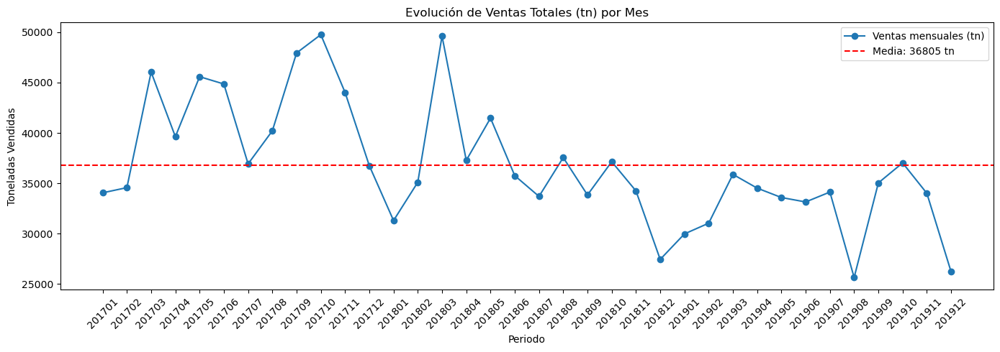

In [289]:
# Ventas
ventas_mensuales = df.groupby('periodo')['tn'].sum().reset_index()

# Calcular media
media_tn = ventas_mensuales['tn'].mean()

# Gráfico
plt.figure(figsize=(14, 5))
plt.plot(ventas_mensuales['periodo'].astype(str), ventas_mensuales['tn'],
         marker='o', label='Ventas mensuales (tn)')

# Línea de media
plt.axhline(media_tn, color='red', linestyle='--', label=f'Media: {media_tn:.0f} tn')

# Personalización
plt.title("Evolución de Ventas Totales (tn) por Mes")
plt.xlabel("Periodo")
plt.ylabel("Toneladas Vendidas")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [300]:
# Agrupar por periodo: contar registros y sumar toneladas
ventas_por_periodo = (
    df.groupby('periodo')
    .agg(
        cantidad_de_ventas=('product_id', 'count'),   # o simplemente usar .size()
        toneladas_vendidas=('tn', 'sum')
    )
    .reset_index()
    .sort_values('periodo')
)

# Mostrar resumen
print(ventas_por_periodo.head())


   periodo  cantidad_de_ventas  toneladas_vendidas
0   201701               78830         34057.31784
1   201702               82270         34568.65311
2   201703               90603         46040.59636
3   201704               82837         39625.52445
4   201705               96042         45579.63296


##### Datos Generales de las ventas

📆 Las ventas van desde 2017-01 hasta 2019-12
📈 Tenemos 36 meses de historia

📊 Estadísticas descriptivas de ventas mensuales:
- Media:             36805.24
- Mediana:           35430.90
- Moda:              25652.96
- Desviación estándar: 6095.06
- Varianza:          37149708.83
- Mínimo:            25652.96
- Máximo:            49750.29
- Rango:             24097.33
- Coef. de variación: 16.56%


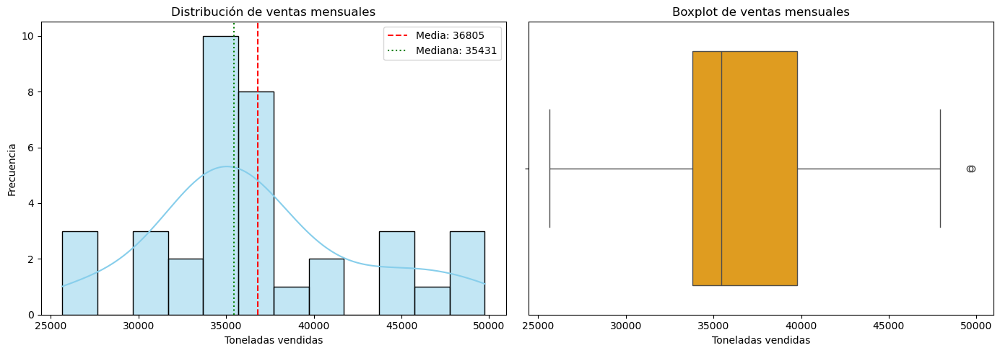

In [297]:
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# --------------------------------------------
# 1. Convertir 'periodo' a datetime y calcular rango de fechas
# --------------------------------------------

# Asegurarse que 'periodo' sea string y convertirlo a datetime
df['periodo_dt'] = pd.to_datetime(df['periodo'].astype(str), format='%Y%m')

# Obtener fechas mínima y máxima del historial
fecha_min = df['periodo_dt'].min()
fecha_max = df['periodo_dt'].max()

# Calcular la cantidad de meses entre ambas fechas (inclusive)
cantidad_meses = (fecha_max.year - fecha_min.year) * 12 + (fecha_max.month - fecha_min.month) + 1

# Mostrar resumen de rango temporal
print(f"📆 Las ventas van desde {fecha_min.strftime('%Y-%m')} hasta {fecha_max.strftime('%Y-%m')}")
print(f"📈 Tenemos {cantidad_meses} meses de historia\n")

# --------------------------------------------
# 2. Agrupar ventas por mes
# --------------------------------------------

ventas_mensuales = (
    df.groupby('periodo')['tn']
    .sum()
    .reset_index()
)

# Vector con las ventas mensuales
ventas = ventas_mensuales['tn']

# --------------------------------------------
# 3. Estadísticas descriptivas
# --------------------------------------------

media         = ventas.mean()
mediana       = ventas.median()
moda          = stats.mode(ventas, keepdims=True).mode[0]
desviacion_std = ventas.std()
varianza      = ventas.var()
minimo        = ventas.min()
maximo        = ventas.max()
rango         = maximo - minimo
cv            = desviacion_std / media  # Coeficiente de variación

# Mostrar resultados
print("📊 Estadísticas descriptivas de ventas mensuales:")
print(f"- Media:             {media:.2f}")
print(f"- Mediana:           {mediana:.2f}")
print(f"- Moda:              {moda:.2f}")
print(f"- Desviación estándar: {desviacion_std:.2f}")
print(f"- Varianza:          {varianza:.2f}")
print(f"- Mínimo:            {minimo:.2f}")
print(f"- Máximo:            {maximo:.2f}")
print(f"- Rango:             {rango:.2f}")
print(f"- Coef. de variación: {cv:.2%}")



# --------------------------------------------
# 4. Visualización de la distribución
# --------------------------------------------

plt.figure(figsize=(14, 5))

# Histograma con curva de densidad (KDE)
plt.subplot(1, 2, 1)
sns.histplot(ventas, bins=12, kde=True, color='skyblue')
plt.axvline(media, color='red', linestyle='--', label=f'Media: {media:.0f}')
plt.axvline(mediana, color='green', linestyle=':', label=f'Mediana: {mediana:.0f}')
plt.title("Distribución de ventas mensuales")
plt.xlabel("Toneladas vendidas")
plt.ylabel("Frecuencia")
plt.legend()

# Boxplot para detectar outliers
plt.subplot(1, 2, 2)
sns.boxplot(x=ventas, color='orange')
plt.title("Boxplot de ventas mensuales")
plt.xlabel("Toneladas vendidas")

plt.tight_layout()
plt.show()

##### Clasificación de productos según su historial de ventas

In [298]:
# --------------------------------------------
# 1. Calcular cuántos meses con ventas tuvo cada producto
# --------------------------------------------

# Filtrar ventas mayores a cero y contar la cantidad de meses únicos con ventas por producto
historial = (
    df[df['tn'] > 0]
    .groupby('product_id')['periodo']
    .nunique()
    .reset_index()
    .rename(columns={'periodo': 'meses_con_ventas'})
)

# --------------------------------------------
# 2. Clasificar productos según su antigüedad (historial mensual)
# --------------------------------------------

productos_con_menos_6m    = historial[historial['meses_con_ventas'] < 6]['product_id'].tolist()
productos_entre_6y12m     = historial[(historial['meses_con_ventas'] >= 6) & (historial['meses_con_ventas'] < 12)]['product_id'].tolist()
productos_entre_12y24m    = historial[(historial['meses_con_ventas'] >= 12) & (historial['meses_con_ventas'] < 24)]['product_id'].tolist()
productos_entre_24y36m    = historial[(historial['meses_con_ventas'] >= 24) & (historial['meses_con_ventas'] < 36)]['product_id'].tolist()
productos_con_36m_exactos = historial[historial['meses_con_ventas'] == 36]['product_id'].tolist()

# --------------------------------------------
# 3. Mostrar resultados
# --------------------------------------------

print("📊 Clasificación de productos según su historial de ventas:")
print(f"- Productos con menos de 6 meses de ventas:       {len(productos_con_menos_6m)}")
print(f"- Productos con entre 6 y 12 meses de ventas:     {len(productos_entre_6y12m)}")
print(f"- Productos con entre 12 y 24 meses de ventas:    {len(productos_entre_12y24m)}")
print(f"- Productos con entre 24 y 36 meses de ventas:    {len(productos_entre_24y36m)}")
print(f"- Productos con exactamente 36 meses de ventas:   {len(productos_con_36m_exactos)}")



📊 Clasificación de productos según su historial de ventas:
- Productos con menos de 6 meses de ventas:       105
- Productos con entre 6 y 12 meses de ventas:     167
- Productos con entre 12 y 24 meses de ventas:    181
- Productos con entre 24 y 36 meses de ventas:    244
- Productos con exactamente 36 meses de ventas:   536


##### Multinacional fallo en honrar la cantidad mesual pedida por un cliente el 0.58% 

In [305]:
requests =  (df[df['cust_request_tn'] != df['tn']].shape[0] * 100) / df.shape[0]
print(f"Tenemos un {round(requests,2)}% de incumplimiento.")

Tenemos un 0.58% de incumplimiento.


##### Categorias 1

In [310]:
cat1 = productos['cat1'].unique()
print(f"Tenemos {cat1.shape[0]} categorias que son {cat1}")

Tenemos 4 categorias que son ['HC' 'PC' 'FOODS' 'REF']


In [314]:
cat1_cat2_counts = productos.groupby('cat1')['cat2'].nunique().reset_index()
cat1_cat2_counts = cat1_cat2_counts.rename(columns={'cat2': 'cantidad_cat2'})
print("Cantidad de subcategorías que tiene c/cat1: ")
cat1_cat2_counts

Cantidad de subcategorías que tiene c/cat1: 


,cat1,cantidad_cat2
0,FOODS,3
1,HC,6
2,PC,5
3,REF,1


##### Categoria 1 - Ventas Mensuales

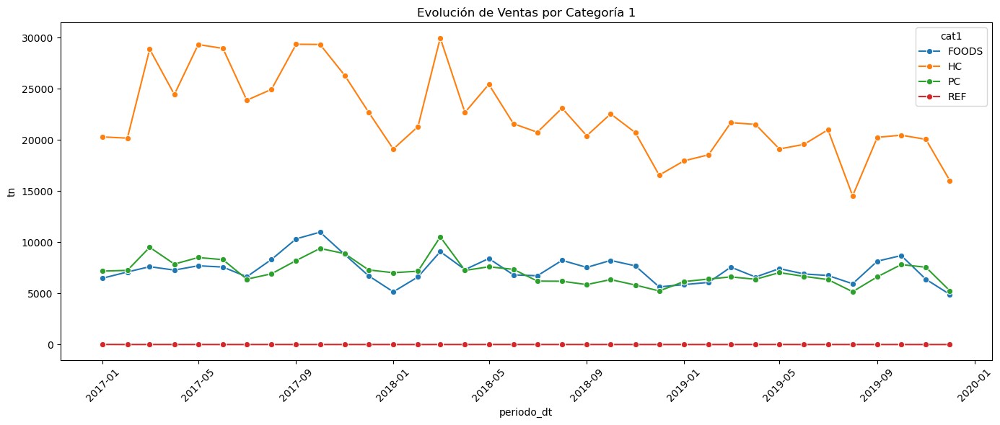

In [312]:
# ANÁLISIS POR CATEGORÍA 1
cat_ventas = df.groupby(['periodo', 'cat1'])['tn'].sum().reset_index()
cat_ventas['periodo_dt'] = pd.to_datetime(cat_ventas['periodo'].astype(str), format='%Y%m')

plt.figure(figsize=(14, 6))
sns.lineplot(data=cat_ventas, x='periodo_dt', y='tn', hue='cat1', marker='o')
plt.title("Evolución de Ventas por Categoría 1")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Estadisticas basicas sobre categoria 1

In [ ]:
import pandas as pd
from scipy import stats

# --------------------------------------------
# Función: Calcula estadísticas clásicas de un subconjunto de ventas
# --------------------------------------------

def ventas_categoria(ventas_cat, nombre_categoria):
    """
    Calcula y muestra estadísticas descriptivas para una categoría específica de productos.
    
    Parámetros:
    ventas_cat (DataFrame): subconjunto del DataFrame original filtrado por cat1.
    nombre_categoria (str): nombre de la categoría a mostrar en pantalla.
    """
    ventas = ventas_cat['tn']  # Serie de toneladas vendidas

    # Calcular estadísticas básicas
    media      = ventas.mean()
    mediana    = ventas.median()
    moda       = stats.mode(ventas, keepdims=True).mode[0] if not ventas.empty else None
    desviacion = ventas.std()
    varianza   = ventas.var()
    minimo     = ventas.min()
    maximo     = ventas.max()
    rango      = maximo - minimo
    coef_var   = desviacion / media if media != 0 else None

    # Mostrar resumen
    print(f"📊 Estadísticas descriptivas para la categoría '{nombre_categoria}':")
    print(f"- Cantidad de registros:         {ventas.shape[0]}")
    print(f"- Media:                         {media:.2f}")
    print(f"- Mediana:                       {mediana:.2f}")
    print(f"- Moda:                          {moda:.2f}")
    print(f"- Desviación estándar:           {desviacion:.2f}")
    print(f"- Varianza:                      {varianza:.2f}")
    print(f"- Mínimo:                        {minimo:.2f}")
    print(f"- Máximo:                        {maximo:.2f}")
    print(f"- Rango:                         {rango:.2f}")
    print(f"- Coeficiente de variación:      {coef_var:.2%}")
    print("------------------------------------------------------\n")


# --------------------------------------------
# CATEGORÍAS a analizar
# --------------------------------------------

categorias = ['REF', 'FOODS', 'HC', 'PC']

for cat in categorias:
    df_cat = df[df['cat1'] == cat]

    # Mostrar resumen temporal y operativos
    total_ventas = df_cat.shape[0]
    fecha_inicio = df_cat['periodo'].min()
    fecha_fin    = df_cat['periodo'].max()
    ventas_menores_1tn = df_cat[df_cat['tn'] < 1].shape[0]

    print(f"🧾 Categoría '{cat}': {total_ventas} registros de venta")
    print(f"📅 Periodo: {fecha_inicio} ➝ {fecha_fin}")
    print(f"⚠️ Ventas menores a 1 tonelada: {ventas_menores_1tn} casos")
    print("------------------------------------------------------\n")

    # Llamar a la función de estadística
    ventas_categoria(df_cat, cat)

🧾 Categoría 'REF': 6179 registros de venta
📅 Periodo: 201701 ➝ 201912
⚠️ Ventas menores a 1 tonelada: 6177 casos
------------------------------------------------------

📊 Estadísticas descriptivas para la categoría 'REF':
- Cantidad de registros:         6179
- Media:                         0.02
- Mediana:                       0.00
- Moda:                          0.00
- Desviación estándar:           0.06
- Varianza:                      0.00
- Mínimo:                        0.00
- Máximo:                        2.01
- Rango:                         2.01
- Coeficiente de variación:      363.88%
------------------------------------------------------

🧾 Categoría 'FOODS': 551800 registros de venta
📅 Periodo: 201701 ➝ 201912
⚠️ Ventas menores a 1 tonelada: 506973 casos
------------------------------------------------------

📊 Estadísticas descriptivas para la categoría 'FOODS':
- Cantidad de registros:         551800
- Media:                         0.48
- Mediana:                     

Graficos individuales de ventas por categoria 1

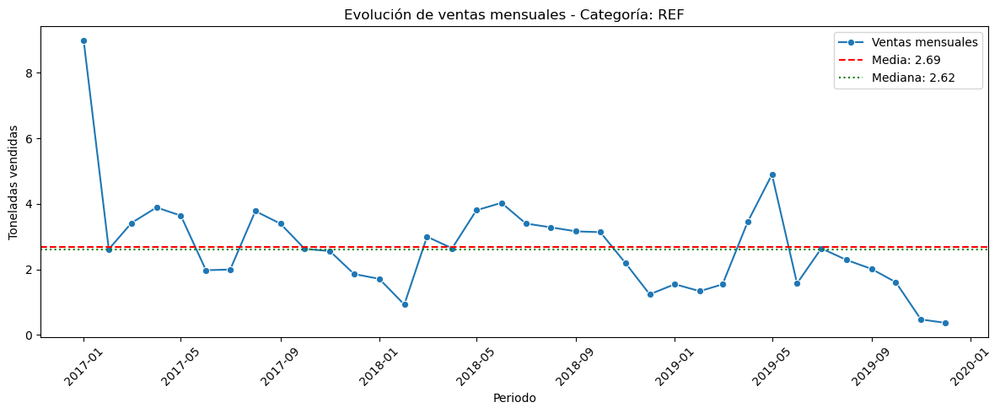

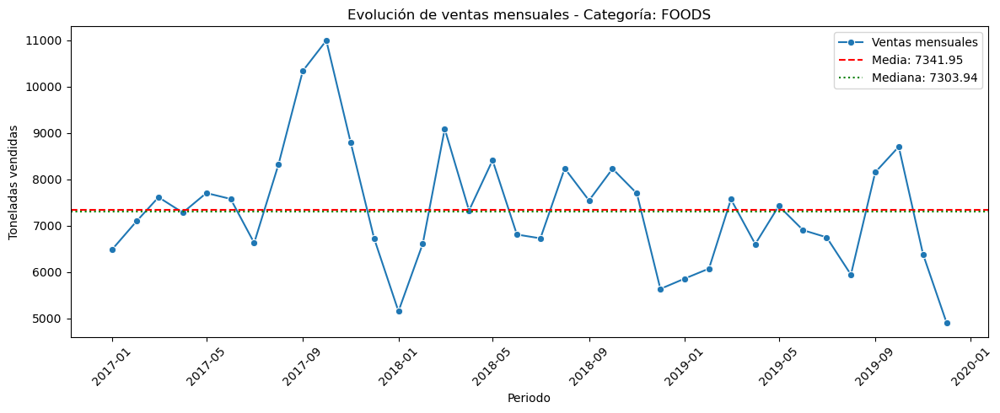

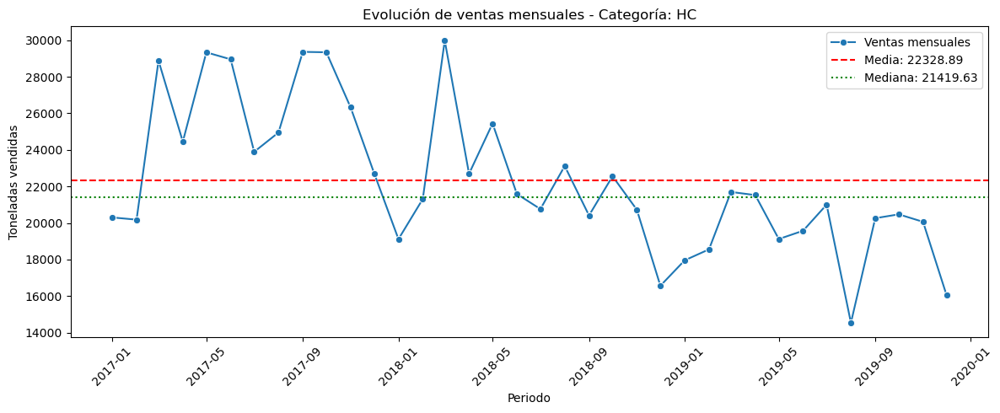

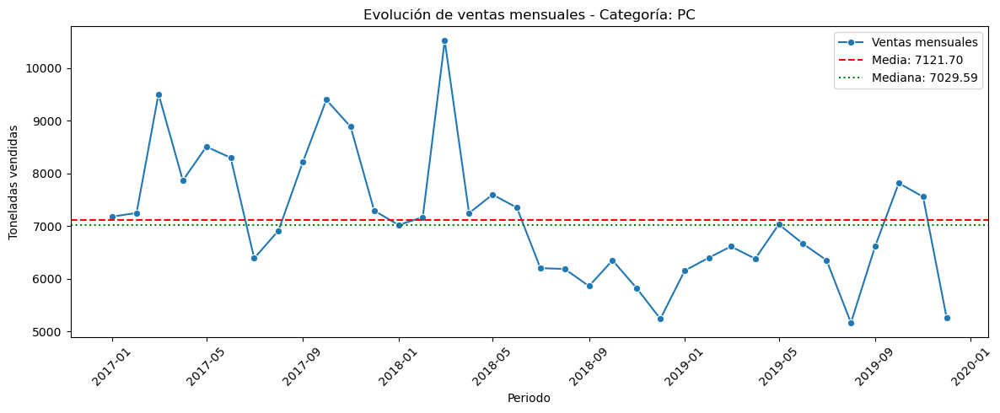

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def graficar_ventas_con_media_mediana(df, cat1):
    """
    Grafica la evolución de ventas mensuales para una categoría (cat1),
    junto con líneas horizontales que indican la media y la mediana.
    """
    # Filtrar por categoría
    df_cat = df[df['cat1'] == cat1]

    # Agrupar ventas por periodo
    ventas_mensuales = df_cat.groupby('periodo')['tn'].sum().reset_index()

    # Convertir a datetime si es necesario
    ventas_mensuales['periodo_dt'] = pd.to_datetime(ventas_mensuales['periodo'].astype(str), format='%Y%m')

    # Calcular media y mediana
    media = ventas_mensuales['tn'].mean()
    mediana = ventas_mensuales['tn'].median()

    # Graficar
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=ventas_mensuales, x='periodo_dt', y='tn', marker='o', label='Ventas mensuales')
    plt.axhline(media, color='red', linestyle='--', label=f'Media: {media:.2f}')
    plt.axhline(mediana, color='green', linestyle=':', label=f'Mediana: {mediana:.2f}')

    plt.title(f"Evolución de ventas mensuales - Categoría: {cat1}")
    plt.xlabel("Periodo")
    plt.ylabel("Toneladas vendidas")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

for cat in ['REF', 'FOODS', 'HC', 'PC']:
    graficar_ventas_con_media_mediana(df, cat)

##### Categoria 1: REF

In [323]:
ref = productos[productos['cat1'] == 'REF']
print(f"La categoria REF tiene solo {ref.shape[0]} productos.")
print("Productos pertenecientes a la categoría REF:")
display(ref)

La categoria REF tiene solo 13 productos.
Productos pertenecientes a la categoría REF:


,cat1,cat2,cat3,brand,sku_size,product_id
673,REF,TE,Frutas,TWININGS,20,21271
674,REF,TE,Hierbas,TWININGS,20,21218
675,REF,TE,Especial,TWININGS,10,21257
676,REF,TE,Especial,TWININGS,20,21181
677,REF,TE,Especial,TWININGS,10,21255
678,REF,TE,Especial,TWININGS,20,21170
679,REF,TE,Hierbas,TWININGS,20,21202
680,REF,TE,Frutas,TWININGS,20,21264
681,REF,TE,Verde,TWININGS,20,21192
682,REF,TE,Azul,TWININGS,20,20982


##### Categoría 2

In [333]:

# Agrupar por cat1 y cat2, y contar la cantidad de cat3 distintas en cada grupo
resumen = (
    df.groupby(['cat1', 'cat2'])['cat3']
    .nunique()
    .reset_index()
    .rename(columns={'cat3': 'cantidad_cat3'})
    .sort_values(['cat1', 'cat2'])
)

for cat1 in resumen['cat1'].unique():
    print(f"\n📂 Categoría 1: {cat1}")
    df_cat1 = resumen[resumen['cat1'] == cat1]
    for _, row in df_cat1.iterrows():
        print(f"   └── {row['cat2']} → {row['cantidad_cat3']} subcategorías (cat3)")




📂 Categoría 1: FOODS
   └── ADEREZOS → 7 subcategorías (cat3)
   └── OTROS → 5 subcategorías (cat3)
   └── SOPAS Y CALDOS → 12 subcategorías (cat3)

📂 Categoría 1: HC
   └── HOGAR → 11 subcategorías (cat3)
   └── PROFESIONAL → 17 subcategorías (cat3)
   └── ROPA ACONDICIONADOR → 3 subcategorías (cat3)
   └── ROPA LAVADO → 2 subcategorías (cat3)
   └── ROPA MANCHAS → 1 subcategorías (cat3)
   └── VAJILLA → 4 subcategorías (cat3)

📂 Categoría 1: PC
   └── CABELLO → 12 subcategorías (cat3)
   └── DENTAL → 2 subcategorías (cat3)
   └── DEOS → 9 subcategorías (cat3)
   └── PIEL1 → 7 subcategorías (cat3)
   └── PIEL2 → 13 subcategorías (cat3)

📂 Categoría 1: REF
   └── TE → 5 subcategorías (cat3)


##### Categoría 2 - Estadísticas Básicas

In [343]:
from scipy import stats

def estadisticas_por_cat2(df, cat1_objetivo):
    # Filtrar el dataframe por la categoría cat1 deseada
    df_filtrado = df[df['cat1'] == cat1_objetivo]

    # Agrupar por cat2 y calcular estadísticas
    resumen = (
        df_filtrado.groupby('cat2')['tn']
        .agg(
            registros = 'count',
            media = 'mean',
            mediana = 'median',
            desviacion = 'std',
            minimo = 'min',
            maximo = 'max',
            rango = lambda x: x.max() - x.min(),
            moda = lambda x: stats.mode(x, keepdims=True).mode[0] if len(x) > 0 else None,
            coef_var = lambda x: x.std() / x.mean() if x.mean() != 0 else None
        )
        .reset_index()
        .sort_values(by='media', ascending=False)
    )

    return resumen

for cat in ['REF', 'FOODS', 'HC', 'PC']:
    display(f"Categoria 1 - {cat}")
    display(estadisticas_por_cat2(df, cat))
    

'Categoria 1 - REF'

,cat2,registros,media,mediana,desviacion,minimo,maximo,rango,moda,coef_var
0,TE,6179,0.015692,0.00291,0.0571,0.00022,2.0071,2.00688,0.00146,3.63879


'Categoria 1 - FOODS'

,cat2,registros,media,mediana,desviacion,minimo,maximo,rango,moda,coef_var
0,ADEREZOS,199765,0.904779,0.10592,4.556315,0.00164,295.03656,295.03492,0.05460,5.035834
1,OTROS,21784,0.332356,0.07280,0.994663,0.00153,34.18984,34.18831,0.01456,2.992762
2,SOPAS Y CALDOS,330251,0.231118,0.02228,1.187181,0.00010,147.18413,147.18403,0.00830,5.136690


'Categoria 1 - HC'

,cat2,registros,media,mediana,desviacion,minimo,maximo,rango,moda,coef_var
3,ROPA LAVADO,248808,1.775304,0.21281,8.168984,0.00111,547.87849,547.87738,0.08736,4.601457
2,ROPA ACONDICIONADOR,82492,1.275299,0.14414,5.673433,0.00602,234.69166,234.68564,0.11675,4.448709
4,ROPA MANCHAS,10173,0.976509,0.30576,2.403403,0.01529,47.57626,47.56097,0.15288,2.461220
5,VAJILLA,155239,0.924401,0.12085,3.775015,0.00153,252.36360,252.36207,0.78419,4.083743
1,PROFESIONAL,8513,0.793738,0.20147,1.657815,0.00341,26.55380,26.55039,0.05460,2.088617
0,HOGAR,223478,0.432858,0.06552,1.857157,0.00026,107.82135,107.82109,0.04095,4.290458


'Categoria 1 - PC'

,cat2,registros,media,mediana,desviacion,minimo,maximo,rango,moda,coef_var
4,PIEL2,209945,0.262902,0.04423,0.959547,0.00124,45.26777,45.26653,0.01638,3.649825
0,CABELLO,807773,0.196361,0.03274,0.796272,0.00041,100.79597,100.79556,0.00451,4.055143
2,DEOS,510270,0.074618,0.01048,0.317779,0.00023,29.75591,29.75568,0.00983,4.258764
3,PIEL1,90819,0.037311,0.00875,0.126433,0.00072,6.03707,6.03635,0.00218,3.388583
1,DENTAL,32881,0.033682,0.00942,0.091433,0.00013,3.06044,3.06031,0.00885,2.714622


##### Categoría 2 (Gráficos)

'Categoria 1 - REF'

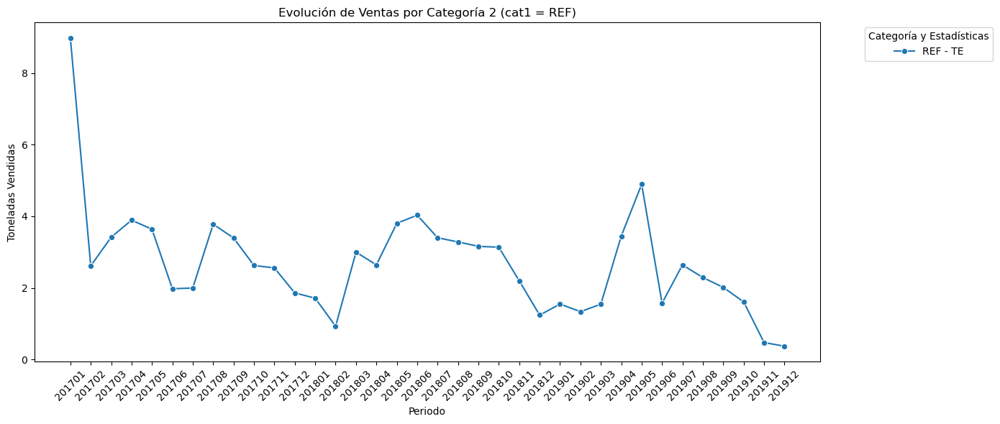

'Categoria 1 - FOODS'

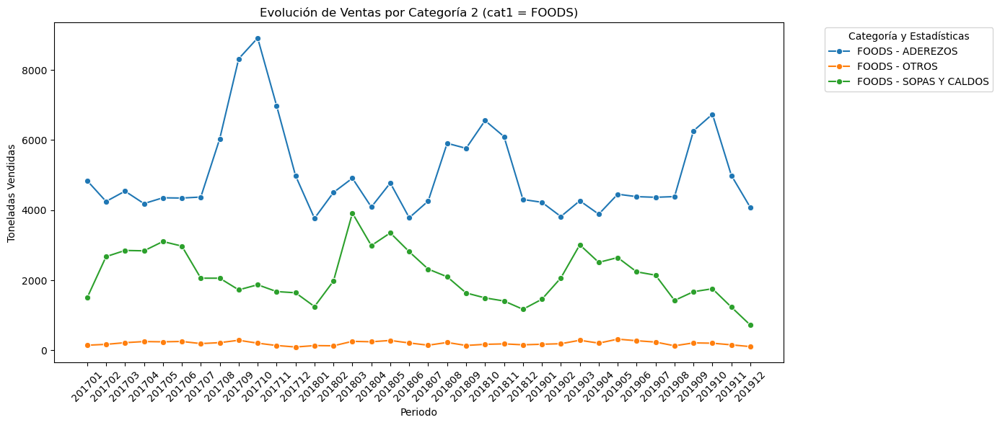

'Categoria 1 - HC'

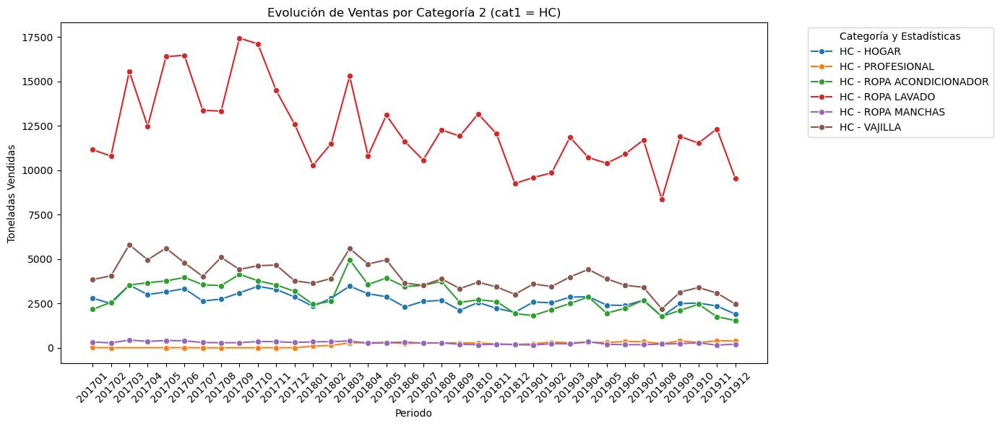

'Categoria 1 - PC'

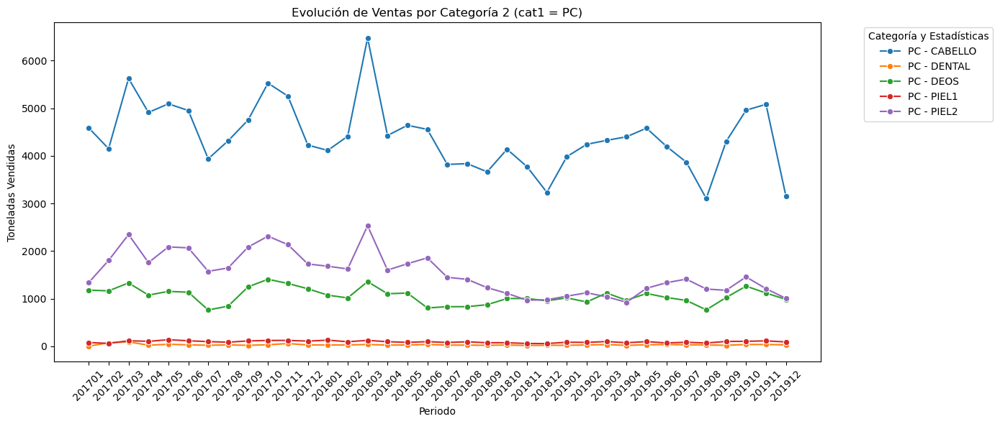

In [346]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def graficar_cat1(df, cat1):
    # Agrupar por periodo, cat1 y cat2, sumando toneladas
    ventas_cat = df.groupby(['periodo', 'cat1', 'cat2'])['tn'].sum().reset_index()
    ventas_cat['periodo'] = ventas_cat['periodo'].astype(str)
    ventas_cat = ventas_cat[ventas_cat['cat1'] == cat1]

    # Crear columna combinada para la leyenda
    ventas_cat['cat1_cat2'] = ventas_cat['cat1'] + " - " + ventas_cat['cat2']

    # Calcular estadísticas globales para esa categoría
    tn_values = ventas_cat['tn']
    media = tn_values.mean()
    mediana = tn_values.median()
    moda = stats.mode(tn_values, keepdims=True).mode[0]

    # Graficar
    plt.figure(figsize=(14, 6))
    sns.lineplot(data=ventas_cat, x='periodo', y='tn', hue='cat1_cat2', marker='o')

    # Líneas horizontales
    # plt.axhline(media, color='red', linestyle='--', label=f'Media: {media:.2f}')
    # plt.axhline(mediana, color='green', linestyle=':', label=f'Mediana: {mediana:.2f}')
    # plt.axhline(moda, color='blue', linestyle='-.', label=f'Moda: {moda:.2f}')

    # Personalización
    plt.title(f"Evolución de Ventas por Categoría 2 (cat1 = {cat1})")
    plt.xlabel("Periodo")
    plt.ylabel("Toneladas Vendidas")
    plt.xticks(rotation=45)
    plt.legend(title='Categoría y Estadísticas', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


for cat in ['REF', 'FOODS', 'HC', 'PC']:
    display(f"Categoria 1 - {cat}")
    graficar_cat1(df, cat)





##### Categoría 3

Resumen

In [347]:
# Agrupar por cat1, cat2 y cat3, y contar cuántos product_id distintos hay en cada combinación
resumen = (
    df.groupby(['cat1', 'cat2', 'cat3'])['product_id']
    .nunique()
    .reset_index()
    .rename(columns={'product_id': 'cantidad_productos'})
    .sort_values(['cat1', 'cat2', 'cat3'])
)

# Mostrar resultado en formato jerárquico
for cat1 in resumen['cat1'].unique():
    print(f"\n📂 Categoría 1: {cat1}")
    df_cat1 = resumen[resumen['cat1'] == cat1]
    
    for cat2 in df_cat1['cat2'].unique():
        print(f"  └📁 Categoría 2: {cat2}")
        df_cat2 = df_cat1[df_cat1['cat2'] == cat2]
        
        for _, row in df_cat2.iterrows():
            print(f"     └─ 📄 {row['cat3']} → {row['cantidad_productos']} productos")



📂 Categoría 1: FOODS
  └📁 Categoría 2: ADEREZOS
     └─ 📄 Aji Picante → 1 productos
     └─ 📄 Barbacoa → 3 productos
     └─ 📄 Chimichurri → 1 productos
     └─ 📄 Ketchup → 9 productos
     └─ 📄 Mayonesa → 36 productos
     └─ 📄 Mostaza → 14 productos
     └─ 📄 Salsa Golf → 5 productos
  └📁 Categoría 2: OTROS
     └─ 📄 Almidon → 2 productos
     └─ 📄 Bizcochuelo → 5 productos
     └─ 📄 Galletitas → 3 productos
     └─ 📄 Granolas → 6 productos
     └─ 📄 Pastas → 3 productos
  └📁 Categoría 2: SOPAS Y CALDOS
     └─ 📄 Baking Bags → 8 productos
     └─ 📄 Caldo Cubo → 18 productos
     └─ 📄 Caldos Granulados → 10 productos
     └─ 📄 Dishes → 11 productos
     └─ 📄 Pure de Papas → 4 productos
     └─ 📄 Pure de Tomate → 1 productos
     └─ 📄 PurePapas → 1 productos
     └─ 📄 Salsas → 5 productos
     └─ 📄 Salsas Dry → 5 productos
     └─ 📄 Salsas Wet → 9 productos
     └─ 📄 Sazonadores → 15 productos
     └─ 📄 Sopas → 46 productos

📂 Categoría 1: HC
  └📁 Categoría 2: HOGAR
     └─ 📄 Antigras

Grafico por Categoria 3

In [ ]:
import math

def graficar_cat3_en_columnas(df, cat1, cat2):
    # Agrupar por periodo, cat1, cat2, cat3
    ventas_cat = df[(df['cat1'] == cat1) & (df['cat2'] == cat2)]
    ventas_cat = ventas_cat.groupby(['periodo', 'cat1', 'cat2','cat3'])['tn'].sum().reset_index()
    ventas_cat['periodo_dt'] = pd.to_datetime(ventas_cat['periodo'].astype(str), format='%Y%m')

    # Obtener lista de cat3 únicos
    cat3_unicos = ventas_cat['cat3'].unique()
    n = len(cat3_unicos)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    # Crear grid de subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows), sharex=True)
    axes = axes.flatten()

    for i, cat3 in enumerate(cat3_unicos):
        df_filtrado = ventas_cat[ventas_cat['cat3'] == cat3]

        sns.lineplot(
            data=df_filtrado,
            x='periodo_dt',
            y='tn',
            marker='o',
            ax=axes[i]
        )
        axes[i].set_title(f"{cat1} - {cat2} - {cat3}")
        axes[i].set_xlabel("Periodo")
        axes[i].set_ylabel("Toneladas")
        axes[i].tick_params(axis='x', rotation=45, labelbottom=True)

    # Ocultar ejes vacíos si los hay
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

graficar_cat3_en_columnas(df, "FOODS", "ADEREZOS")

##### Cuantos id_producto hay por categoria cat3

'Categoria 1 - REF'

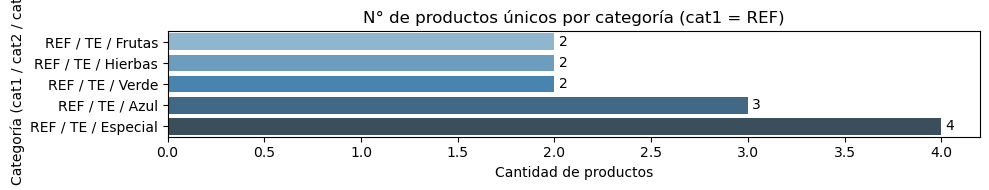

'Categoria 1 - FOODS'

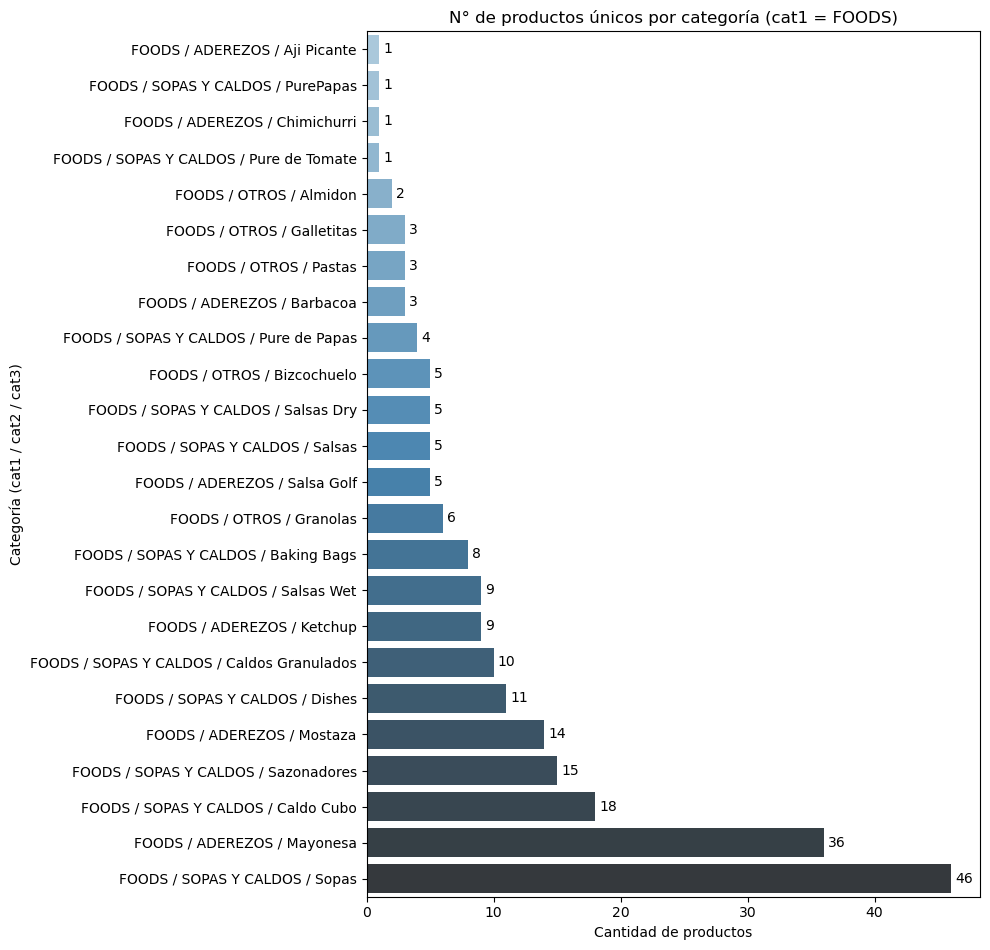

'Categoria 1 - HC'

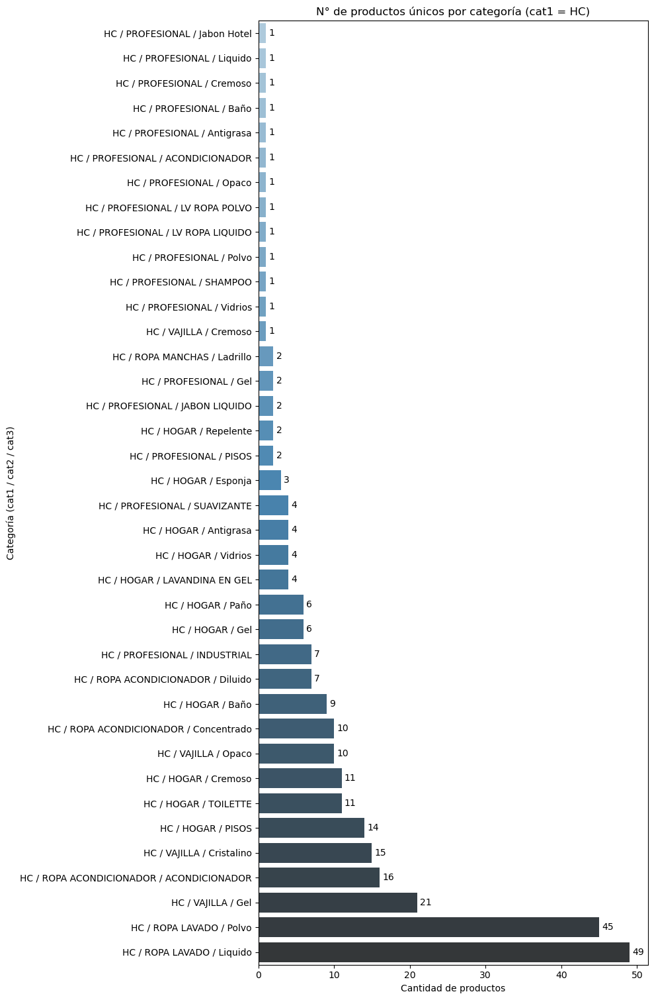

'Categoria 1 - PC'

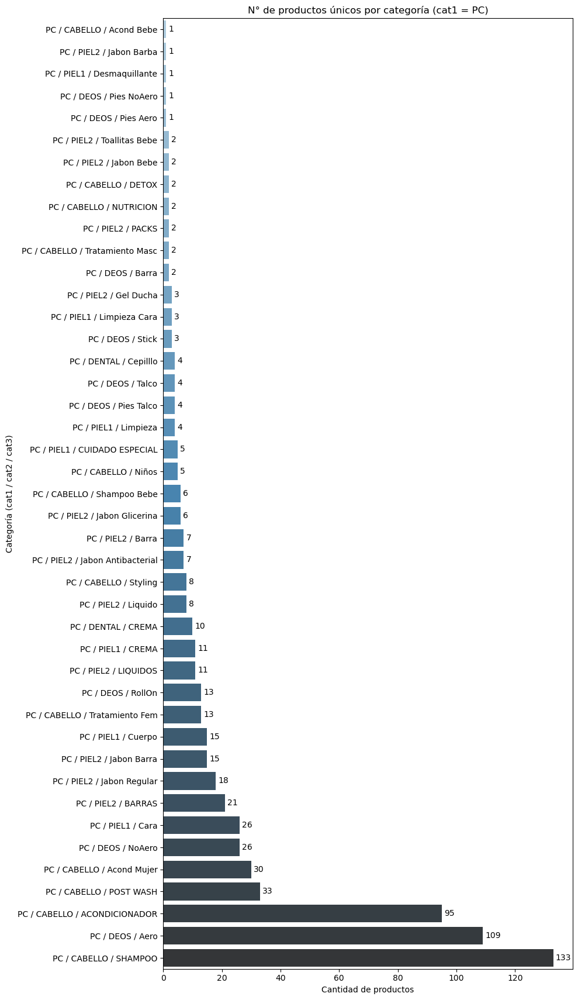

In [356]:
import matplotlib.pyplot as plt
import seaborn as sns

def graficar_productos_vendidos_x_cat3(df, cat1):
    # Filtrar por cat1
    conteo_productos = df[df['cat1'] == cat1]

    # Agrupar y contar productos únicos
    conteo_productos = (
        conteo_productos
        .groupby(['cat1', 'cat2', 'cat3'])['product_id']
        .nunique()
        .reset_index()
        .rename(columns={'product_id': 'cantidad_productos'})
    )

    # Crear etiqueta combinada
    conteo_productos['categoria_completa'] = (
        conteo_productos['cat1'].astype(str) + ' / ' +
        conteo_productos['cat2'].astype(str) + ' / ' +
        conteo_productos['cat3'].astype(str)
    )

    # Ordenar
    conteo_productos = conteo_productos.sort_values(by='cantidad_productos', ascending=True)

    # Plot
    plt.figure(figsize=(10, 0.4 * len(conteo_productos)))
    ax = sns.barplot(
        data=conteo_productos,
        x='cantidad_productos',
        y='categoria_completa',
        hue='categoria_completa',   # Necesario para usar palette sin warning
        palette='Blues_d',
        legend=False                # Ocultar leyenda redundante
    )

    # ✅ Agregar etiquetas a todas las barras
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', padding=3)

    # Títulos y ajustes
    plt.title(f"N° de productos únicos por categoría (cat1 = {cat1})")
    plt.xlabel("Cantidad de productos")
    plt.ylabel("Categoría (cat1 / cat2 / cat3)")
    plt.tight_layout()
    plt.show()




for cat in ['REF', 'FOODS', 'HC', 'PC']:
    display(f"Categoria 1 - {cat}")
    graficar_productos_vendidos_x_cat3(df, cat)


##### Análisis de Cantidad de Ventas

Productos más demandados

In [360]:
ventas_por_producto = (
    df[df['tn'] > 0]
    .groupby('product_id')
    .size()
    .reset_index(name='cantidad_ventas')
    .sort_values(by='cantidad_ventas', ascending=False)
)

print(ventas_por_producto.head(10))  # muestra el top 5

     product_id  cantidad_ventas
110       20111             7973
121       20122             7950
119       20120             7537
323       20326             7397
131       20132             7199
3         20004             7139
274       20276             7097
57        20058             7006
12        20013             6964
26        20027             6964


C:\Users\iparra\AppData\Local\Temp\ipykernel_14948\1338737090.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
C:\Users\iparra\AppData\Local\Temp\ipykernel_14948\1338737090.py:45: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from current font.
  plt.tight_layout()
C:\Users\iparra\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


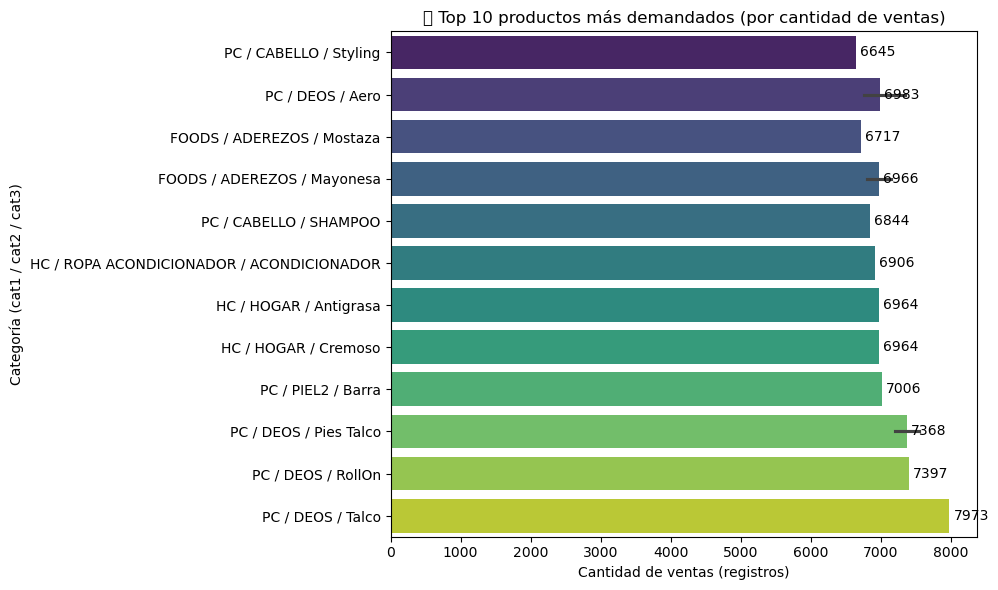

In [365]:
# 1. Filtrar ventas reales y agrupar por producto
ventas_por_producto = (
    df[df['tn'] > 0]
    .groupby('product_id')
    .size()
    .reset_index(name='cantidad_ventas')
)

# 2. Obtener información de categorías para cada producto
info_productos = (
    df[['product_id', 'cat1', 'cat2', 'cat3']]
    .drop_duplicates(subset='product_id')
)

# 3. Unir ventas con información de categoría
ventas_con_categorias = ventas_por_producto.merge(info_productos, on='product_id', how='left')

# 4. Crear etiqueta completa
ventas_con_categorias['etiqueta'] = (
    ventas_con_categorias['cat1'].astype(str) + ' / ' +
    ventas_con_categorias['cat2'].astype(str) + ' / ' +
    ventas_con_categorias['cat3'].astype(str)
)

# 5. Ordenar y tomar top 10 productos más demandados
top_10 = ventas_con_categorias.sort_values(by='cantidad_ventas', ascending=True).tail(20)

# 6. Gráfico
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=top_10,
    x='cantidad_ventas',
    y='etiqueta',
    palette='viridis'
)

# Agregar etiquetas numéricas a cada barra
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)

# Títulos
plt.title("🔝 Top 10 productos más demandados (por cantidad de ventas)")
plt.xlabel("Cantidad de ventas (registros)")
plt.ylabel("Categoría (cat1 / cat2 / cat3)")
plt.tight_layout()
plt.show()


##### Análisis de Brands

In [357]:
df_brand = df.dropna(subset=['brand'])  # 👈 Elimina donde cat1 es NaN
print(f"Top 10 marcas más vendidas: ")
df_brand['brand'].value_counts(normalize=True)[:10]

Top 10 marcas más vendidas: 


brand
NIVEA       0.130799
SHAMPOO3    0.113187
MAGGI       0.104955
DEOS1       0.102024
MUSCULO     0.082590
LIMPIEX     0.067840
SHAMPOO2    0.048250
NATURA      0.041059
SHAMPOO1    0.037303
COLBERT     0.030427
Name: proportion, dtype: float64

C:\Users\iparra\AppData\Local\Temp\ipykernel_14948\1684243029.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['periodo_dt'] = pd.to_datetime(df['periodo'].astype(str), format='%Y%m')


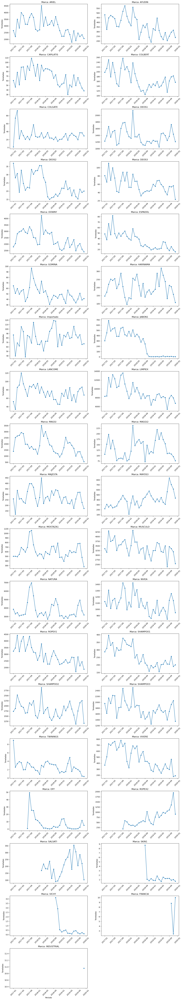

In [366]:
def graficar_ventas_por_brand(df):
    # Asegurar tipo datetime en 'periodo'
    df = df.dropna(subset=['brand'])
    df['periodo_dt'] = pd.to_datetime(df['periodo'].astype(str), format='%Y%m')

    # Agrupar por mes y marca
    df_grouped = df.groupby(['periodo_dt', 'brand'])['tn'].sum().reset_index()

    # Lista de marcas únicas
    marcas = df_grouped['brand'].unique()
    n = len(marcas)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    # Subplots por marca
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 4 * n_rows), sharex=True)
    axes = axes.flatten()

    for i, marca in enumerate(marcas):
        data_marca = df_grouped[df_grouped['brand'] == marca]

        sns.lineplot(
            data=data_marca,
            x='periodo_dt',
            y='tn',
            marker='o',
            ax=axes[i]
        )
        axes[i].set_title(f"Marca: {marca}")
        axes[i].set_xlabel("Periodo")
        axes[i].set_ylabel("Toneladas")
        axes[i].tick_params(axis='x', rotation=45, labelbottom=True)

    # Eliminar ejes vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

graficar_ventas_por_brand(df)

## Clasificacion heuristica simple por Toneladas Vendidas
Etiquetar cada serie de producto (product_id) con una categoría como:

    📈 creciente

    📉 decreciente

    🔁 estacional

    🔀 volátil

    ❌ intermitente o inactiva

   
---

## ✅ ¿Qué hace el código?

1. **Construye una serie temporal mensual por producto (`product_id`)**.
2. **Calcula estadísticas por producto**: cantidad de meses activos, media, desviación, coeficiente de variación (CV) y tendencia.
3. **Clasifica la serie** según esos valores en categorías heurísticas como: `inactiva`, `volátil`, `creciente`, `decreciente`, `estable`.

---

## 📌 Fundamentos detrás de cada parte

### 1. `n_meses`: cantidad de meses con ventas > 0

**Fundamento**: mide actividad. Si un producto aparece en muy pocos meses, no tiene una serie útil para análisis de evolución.

> 🔎 Criterio: si hay menos de 6 meses de ventas → **`inactiva`**.

---

### 2. `cv`: coeficiente de variación = std / media

**Fundamento**: mide **volatilidad relativa**. Cuanto más grande sea el CV, más variable es la serie con respecto a su promedio.

> 🔎 Criterio: si `cv > 1.5` → **`volátil`** (muy errática comparada con su valor promedio).

---

### 3. `tendencia`: correlación con el tiempo

**Fundamento**: se mide la **correlación lineal** entre la serie de ventas y el tiempo (orden temporal de los meses).

* Si la correlación es alta y positiva → la serie es **creciente**
* Si es alta y negativa → **decreciente**
* Si está cerca de 0 → **estable**

> 🔎 Criterios:

* `tendencia > 0.6` → **creciente**
* `tendencia < -0.6` → **decreciente**
* entre `-0.6` y `0.6` → **estable**

---

## 📌 Clasificación heurística: ventajas y limitaciones

| Ventajas                           | Limitaciones                      |
| ---------------------------------- | --------------------------------- |
| Rápida y explicable                | Umbrales son arbitrarios          |
| No requiere modelos de forecasting | No detecta patrones no lineales   |
| Escalable a muchos productos       | No maneja estacionalidad ni ruido |
| Útil como primer diagnóstico       | No detecta anomalías sofisticadas |

---

## 🧠 ¿Es válido este enfoque?

**Sí, como herramienta exploratoria inicial.** Es muy útil para:

* Filtrar productos para análisis posterior
* Generar visualizaciones de resumen
* Priorizar modelos por tipo de comportamiento

Pero no reemplaza un análisis de series más profundo (e.g., con `ARIMA`, `prophet`, `ETS`, etc.) si querés pronosticar.

---

In [373]:
# armá una serie mensual por producto:
ventas = df.groupby(['product_id', 'periodo'])['tn'].sum().reset_index()
ventas['periodo_dt'] = pd.to_datetime(ventas['periodo'].astype(str), format='%Y%m')

# Esto te ayuda a procesar más fácilmente en bloque:
pivot = ventas.pivot(index='product_id', columns='periodo_dt', values='tn').fillna(0)

# Calcular estadísticas por serie
resultados = pd.DataFrame(index=pivot.index)

# Cantidad de puntos
resultados['n_meses'] = (pivot > 0).sum(axis=1)

# Promedio y variabilidad
resultados['media'] = pivot.mean(axis=1)
resultados['desviacion'] = pivot.std(axis=1)
resultados['cv'] = resultados['desviacion'] / resultados['media']  # coef. de variación

# Tendencia (correlación con el tiempo)
periodos = pivot.columns
t = range(len(periodos))
resultados['tendencia'] = pivot.apply(lambda x: pd.Series(x.values).corr(pd.Series(t)), axis=1)

# Estacionalidad: correlación con su promedio mensual por año
# (para más precisión se necesita descomposición estacional, opcional)

In [376]:
resultados.sample(10)

,n_meses,media,desviacion,cv,tendencia
product_id,,,,,
20153,36,48.129883,17.123845,0.355784,0.090272
20993,3,0.056511,0.194513,3.442033,0.469572
21161,34,0.267097,0.327913,1.227692,0.390629
20898,25,1.794174,1.735738,0.967430,0.102801
20221,29,35.135876,26.447376,0.752717,-0.840679
20486,26,10.745999,8.845182,0.823114,-0.906666
20858,11,2.203467,5.560837,2.523676,-0.601971
20390,31,13.206921,7.805424,0.591010,0.111637
20458,9,6.172993,11.251013,1.822619,0.735207


In [186]:
# Clasificacion heuristica simple
def clasificar_serie(row):
    if row['n_meses'] < 6:
        return 'inactiva'
    if row['cv'] > 1.5:
        return 'volátil'
    if row['tendencia'] > 0.6:
        return 'creciente'
    if row['tendencia'] < -0.6:
        return 'decreciente'
    return 'estable'

resultados['tipo_serie'] = resultados.apply(clasificar_serie, axis=1)
resultados[['media', 'cv', 'tendencia', 'tipo_serie']].head()

,media,cv,tendencia,tipo_serie
product_id,,,,
20001,1398.344322,0.213213,0.422670,estable
20002,1009.368178,0.301015,0.643189,creciente
20003,889.004243,0.328499,-0.152258,estable
20004,671.615383,0.334194,0.007898,estable
20005,644.200514,0.338828,0.088067,estable


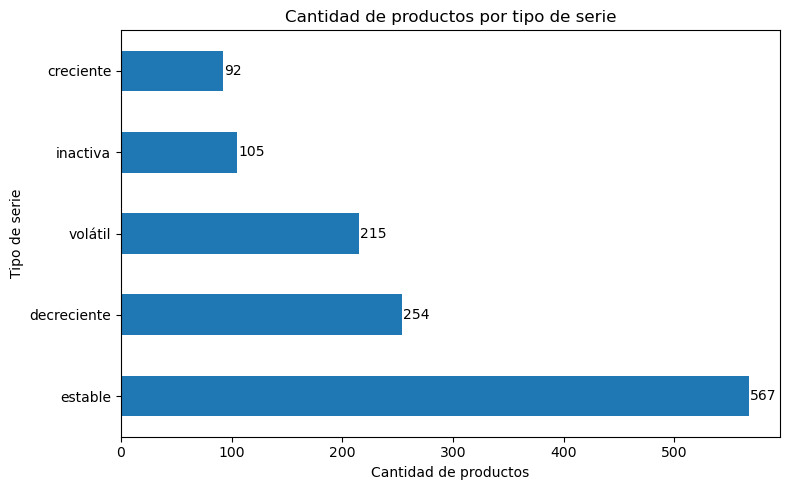

In [367]:
# Crear conteo
conteo = resultados['tipo_serie'].value_counts()

# Crear figura y eje
ax = conteo.plot(kind='barh', title='Cantidad de productos por tipo de serie', figsize=(8, 5))

# Agregar etiquetas numéricas a cada barra
for i, v in enumerate(conteo):
    ax.text(v + 1, i, str(v), va='center')  # v + 1 para que no se solape con la barra

# Etiquetas y ajuste
plt.xlabel("Cantidad de productos")
plt.ylabel("Tipo de serie")
plt.tight_layout()
plt.show()


## Clasificacion heuristica por Nro de Ventas

In [379]:
# 1. Agrupar por producto y mes, contando ventas (registros con ventas)
ventas = df[df['tn'] > 0].groupby(['product_id', 'periodo']).size().reset_index(name='cantidad_ventas')
ventas['periodo_dt'] = pd.to_datetime(ventas['periodo'].astype(str), format='%Y%m')

# 2. Pivotear: filas = productos, columnas = meses, valores = cantidad de ventas (no toneladas)
pivot = ventas.pivot(index='product_id', columns='periodo_dt', values='cantidad_ventas').fillna(0)

# 3. Crear DataFrame para resultados
resultados = pd.DataFrame(index=pivot.index)

# 4. Estadísticas por producto
resultados['n_meses'] = (pivot > 0).sum(axis=1)
resultados['media'] = pivot.mean(axis=1)
resultados['desviacion'] = pivot.std(axis=1)
resultados['cv'] = resultados['desviacion'] / resultados['media']

# 5. Tendencia: correlación con el tiempo
periodos = pivot.columns
t = range(len(periodos))
resultados['tendencia'] = pivot.apply(lambda x: pd.Series(x.values).corr(pd.Series(t)), axis=1)

# 6. Clasificación heurística
def clasificar_serie(row):
    if row['n_meses'] < 6:
        return 'inactiva'
    if row['cv'] > 1.5:
        return 'volátil'
    if row['tendencia'] > 0.6:
        return 'creciente'
    if row['tendencia'] < -0.6:
        return 'decreciente'
    return 'estable'

resultados['tipo_serie'] = resultados.apply(clasificar_serie, axis=1)

# 7. Mostrar resumen
resultados.head()


,n_meses,media,desviacion,cv,tendencia,tipo_serie
product_id,,,,,,
20001,36,171.444444,30.376160,0.177178,-0.210693,estable
20002,36,166.666667,33.914177,0.203485,-0.175679,estable
20003,36,188.694444,27.556508,0.146038,-0.507951,estable
20004,36,198.305556,27.718812,0.139778,-0.356365,estable
20005,36,164.194444,28.972716,0.176454,-0.309867,estable


In [ ]:
resultados[(resultados['tipo_serie'] == 'decreciente') & (resultados['n_meses'] < 24)].sort_values(by='n_meses', ascending=False)
# crecientes = [20402,20112,20049] # 24 meses
# volátil = [20741, 20808, 20891]  # 24 meses
# estable = [20001, 20483, 20538] # 24 meses
# inactiva = [21129, 21146, 20918] # 5 meses
# decreciente = [20983, 21041, 20245] # 23 meses

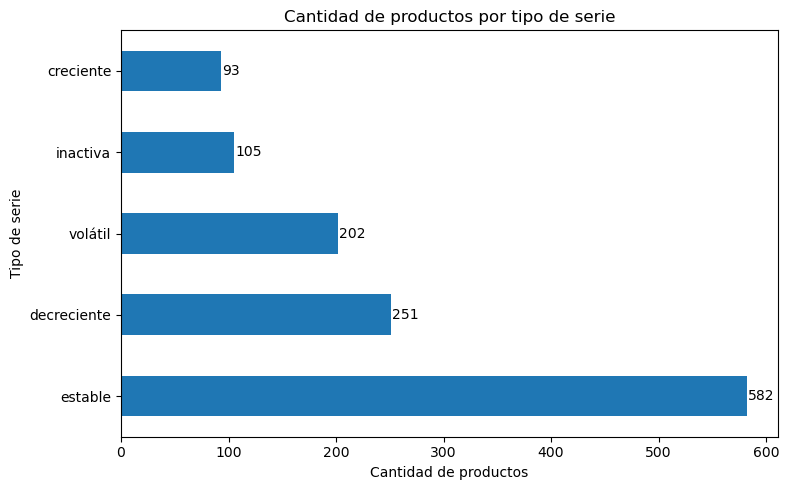

In [378]:
# Crear conteo
conteo = resultados['tipo_serie'].value_counts()

# Crear figura y eje
ax = conteo.plot(kind='barh', title='Cantidad de productos por tipo de serie', figsize=(8, 5))

# Agregar etiquetas numéricas a cada barra
for i, v in enumerate(conteo):
    ax.text(v + 1, i, str(v), va='center')  # v + 1 para que no se solape con la barra

# Etiquetas y ajuste
plt.xlabel("Cantidad de productos")
plt.ylabel("Tipo de serie")
plt.tight_layout()
plt.show()


## Descomposición estacional 

Esto va a:

-    Generar 1 gráfico por producto con su tendencia, estacionalidad y residuo.

-   Aplicarse solo a productos con al menos 24 meses de datos.

-   Ignorar productos con series interrumpidas o que generen errores.

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

serie = pivot.loc[product_id]
serie.index = pd.to_datetime(serie.index)
resultado = seasonal_decompose(serie, model='additive', period=12)
resultado.plot()

##### Descomposicion Serie: CAT1 en base a Toneladas

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import io

def descomposicion_serie_cat1_grid(df, cat1_list=None):
    from PIL import Image
    import matplotlib.image as mpimg

    # Agrupar ventas por cat1 y periodo
    ventas_cat1 = (
        df.groupby(['cat1', 'periodo'])['tn']
        .sum()
        .reset_index()
    )
    ventas_cat1['periodo_dt'] = pd.to_datetime(ventas_cat1['periodo'].astype(str), format='%Y%m')

    # Si no se pasa lista, tomar hasta 4 cat1 distintas
    if cat1_list is None:
        cat1_list = ventas_cat1['cat1'].dropna().unique()[:4]

    n = len(cat1_list)
    n_cols = 2
    n_rows = int((n + 1) // 2)

    # Crear figura contenedora
    # fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12))
    axes = axes.flatten()

    for i, cat in enumerate(cat1_list):
        serie = (
            ventas_cat1[ventas_cat1['cat1'] == cat]
            .set_index('periodo_dt')
            .sort_index()
            .resample('MS')['tn']
            .sum()
        )

        if serie.notna().sum() >= 24:
            try:
                resultado = seasonal_decompose(serie, model='additive', period=12)

                # Crear figura individual en memoria
                temp_fig = resultado.plot()
                temp_fig.suptitle(f"Categoría {cat}", fontsize=14)
                temp_fig.set_size_inches(8, 6)
                # Guardar la figura a un buffer en memoria
                buf = io.BytesIO()
                temp_fig.savefig(buf, format='png')
                buf.seek(0)
                plt.close(temp_fig)  # cerrar la figura temporal

                # Leer como imagen y mostrarla en el subplot general
                img = mpimg.imread(buf)
                axes[i].imshow(img)
                axes[i].axis('off')  # ocultar ejes

            except Exception as e:
                print(f"Error en categoría {cat}: {e}")
                fig.delaxes(axes[i])
        else:
            print(f"Categoría {cat} no tiene suficientes datos.")
            fig.delaxes(axes[i])

    # Eliminar ejes vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


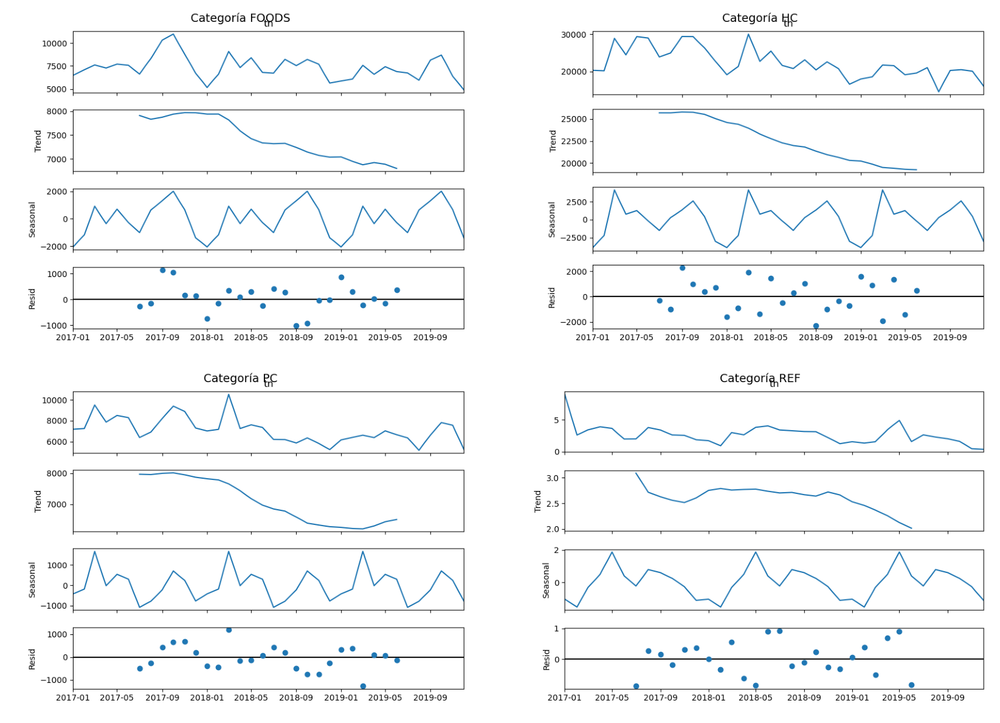

In [225]:
descomposicion_serie_cat1_grid(df)

##### Descomposicion de la serie por ventas

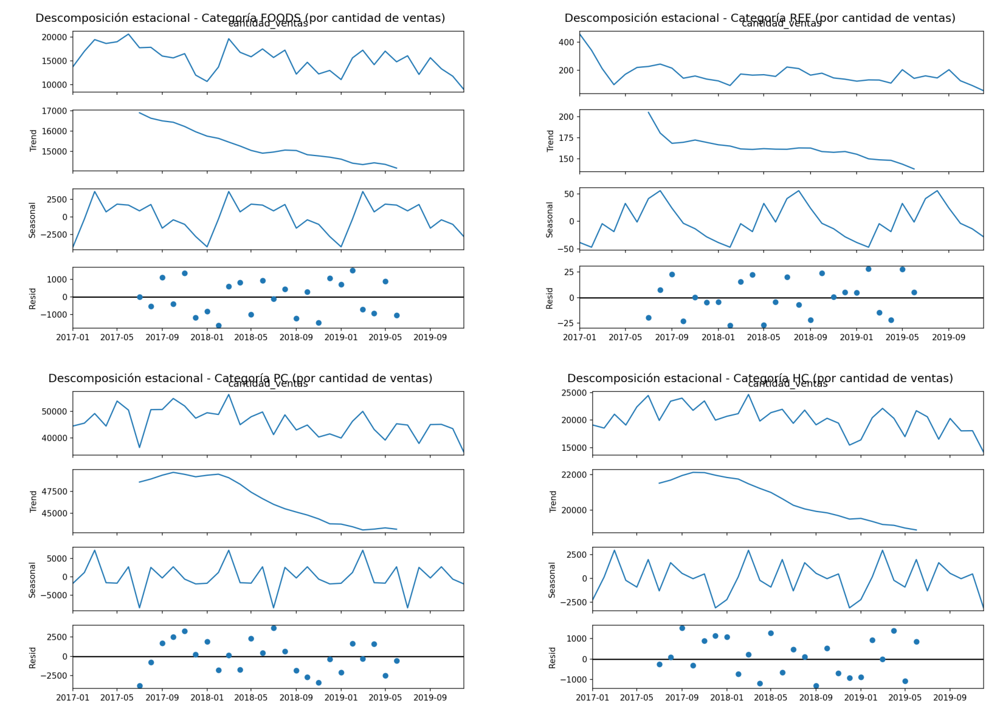

In [380]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import io
import pandas as pd
import math

def descomposicion_serie_cat1_grid(df, cat1_list=None):
    """
    Descompone series temporales de frecuencia de ventas (no toneladas) por categoría cat1.
    Genera un gráfico por cada categoría mostrando la serie, tendencia, estacionalidad y residuo.
    """

    # Agrupar por cat1 y periodo, contando la cantidad de ventas (registros)
    ventas_cat1 = (
        df[df['tn'] > 0]  # solo ventas reales
        .groupby(['cat1', 'periodo'])
        .size()
        .reset_index(name='cantidad_ventas')
    )
    ventas_cat1['periodo_dt'] = pd.to_datetime(ventas_cat1['periodo'].astype(str), format='%Y%m')

    # Si no se pasa lista, tomar las primeras 4 cat1 disponibles
    if cat1_list is None:
        cat1_list = ventas_cat1['cat1'].dropna().unique()[:4]

    n = len(cat1_list)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = axes.flatten()

    for i, cat in enumerate(cat1_list):
        # Construir serie temporal de frecuencia mensual
        serie = (
            ventas_cat1[ventas_cat1['cat1'] == cat]
            .set_index('periodo_dt')
            .sort_index()
            .resample('MS')['cantidad_ventas']
            .sum()
        )

        # Solo descomponer si hay al menos 24 puntos
        if serie.notna().sum() >= 24:
            try:
                resultado = seasonal_decompose(serie, model='additive', period=12)

                # Crear figura temporal
                temp_fig = resultado.plot()
                temp_fig.suptitle(f"Descomposición estacional - Categoría {cat} (por cantidad de ventas)", fontsize=14)
                temp_fig.set_size_inches(8, 6)

                # Guardar figura a un buffer
                buf = io.BytesIO()
                temp_fig.savefig(buf, format='png', dpi=150)
                buf.seek(0)
                plt.close(temp_fig)

                # Mostrar como imagen en la grilla
                img = mpimg.imread(buf)
                axes[i].imshow(img)
                axes[i].axis('off')

            except Exception as e:
                print(f"Error en categoría {cat}: {e}")
                fig.delaxes(axes[i])
        else:
            print(f"Categoría {cat} no tiene suficientes datos.")
            fig.delaxes(axes[i])

    # Ocultar subplots vacíos si hay menos de 4
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

descomposicion_serie_cat1_grid(df, cat1_list=['FOODS', 'REF', 'PC', 'HC'])

##### Descomposición Serie: CAT2 por Toneladas Vendidas

cat 1 - FOODS


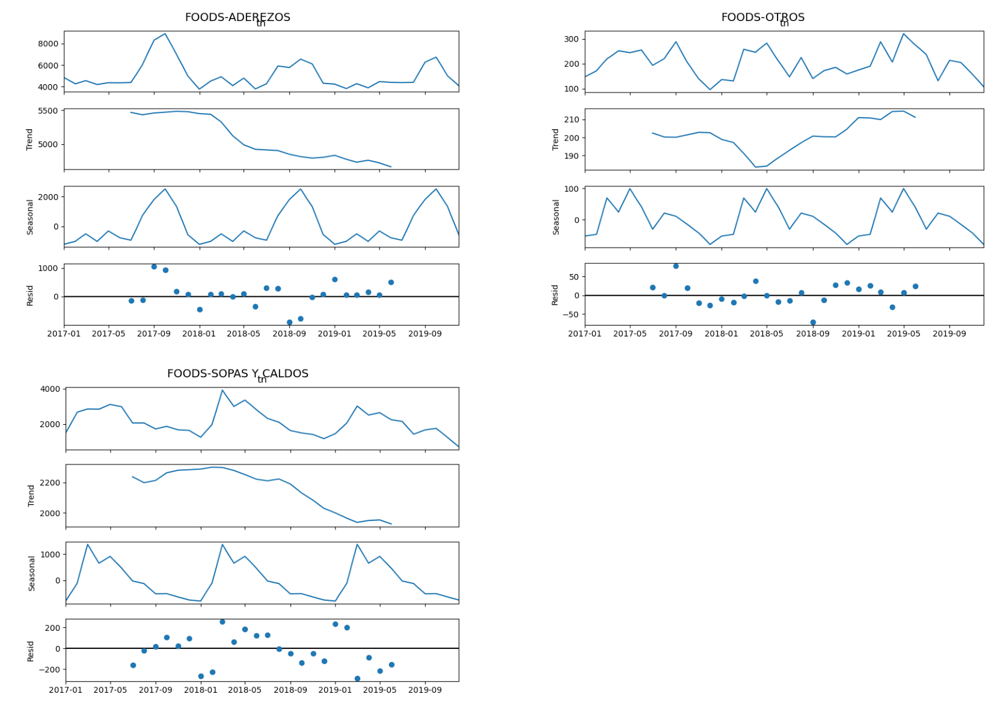

cat 1 - REF


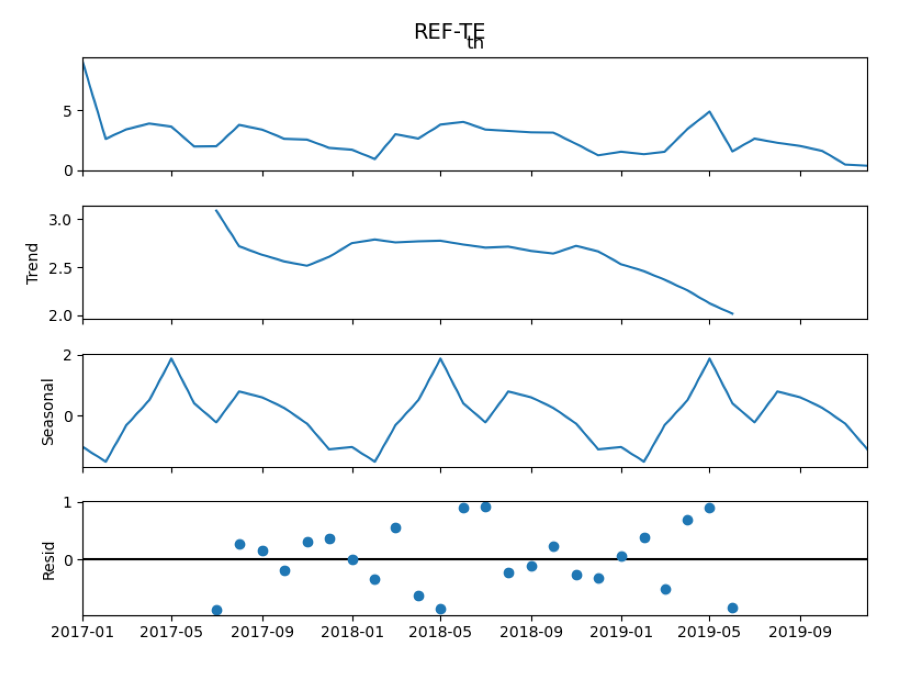

cat 1 - PC


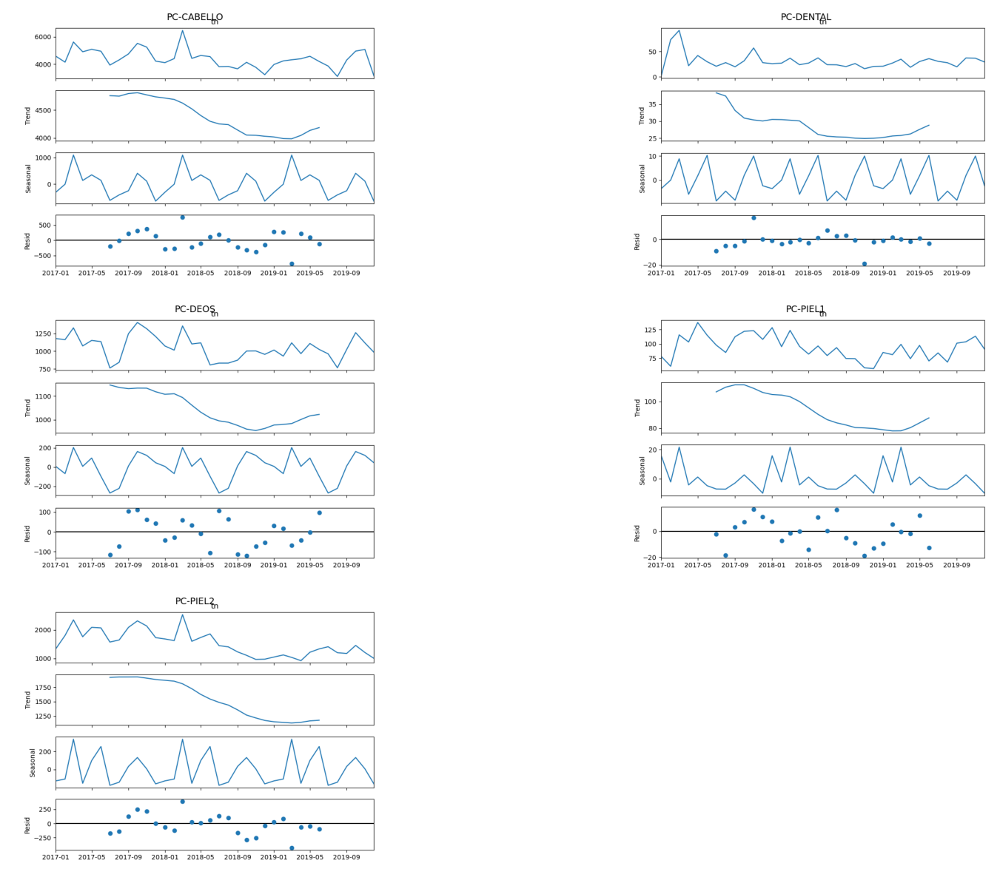

cat 1 - HC


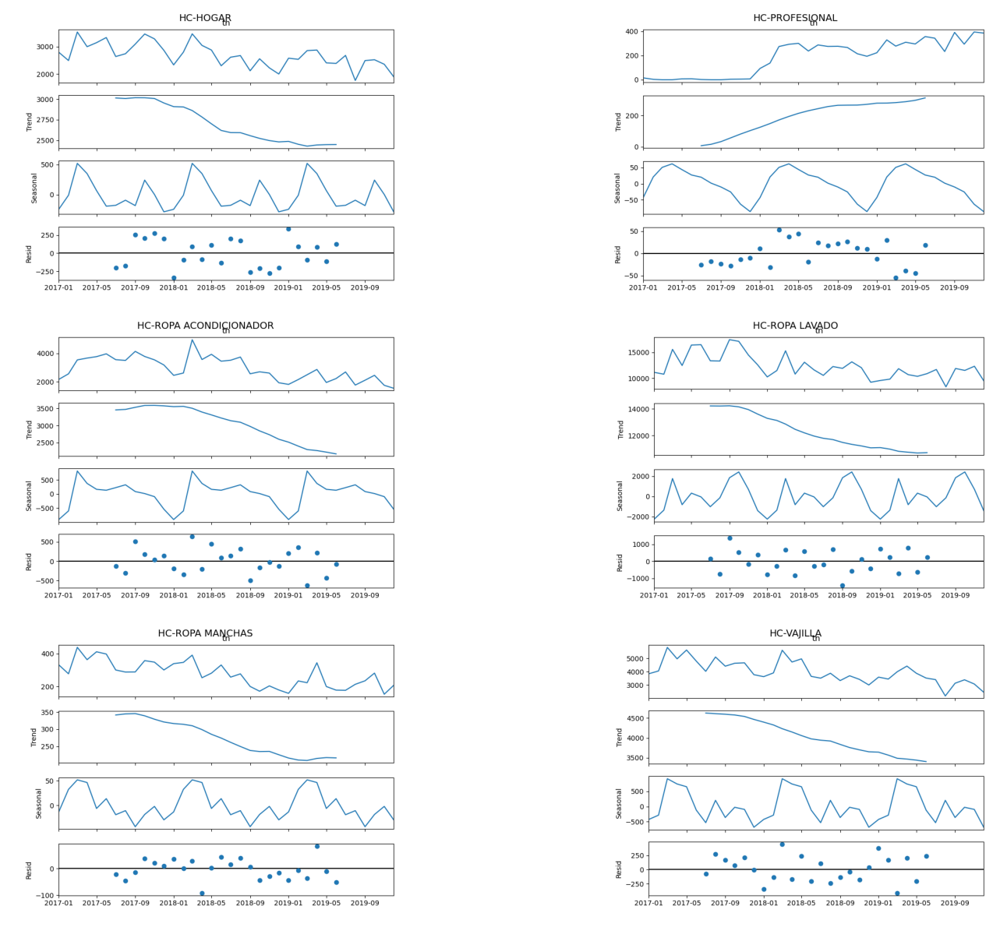

In [382]:
def descomposicion_serie_cat2_grid(df, cat1=None):
    from PIL import Image
    import matplotlib.image as mpimg

    ventas_cat1 = df[df['cat1'] == cat1]

    # Agrupar ventas por cat1 y periodo
    ventas_cat1 = (
        ventas_cat1.groupby(['cat1','cat2','periodo'])['tn']
        .sum()
        .reset_index()
    )
    ventas_cat1['periodo_dt'] = pd.to_datetime(ventas_cat1['periodo'].astype(str), format='%Y%m')
    ventas_cat1['cat1y2'] = ventas_cat1['cat1'] + "-" +  ventas_cat1['cat2']

    # Si no se pasa lista, tomar hasta 4 cat1 distintas
    cat2_list = ventas_cat1['cat2'].dropna().unique()

    n = len(cat2_list)
    n_cols = 2
    n_rows = int((n + 1) // 2)

    # Crear figura contenedora
    # fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12))
    axes = axes.flatten()

    for i, cat in enumerate(cat2_list):
        serie = (
            ventas_cat1[ventas_cat1['cat2'] == cat]
            .set_index('periodo_dt')
            .sort_index()
            .resample('MS')['tn']
            .sum()
        )

        if serie.notna().sum() >= 24:
            try:
                resultado = seasonal_decompose(serie, model='additive', period=12)

                # Crear figura individual en memoria
                temp_fig = resultado.plot()
                temp_fig.suptitle(f"{cat1 + '-' + cat}", fontsize=14)
                temp_fig.set_size_inches(8, 6)
                # Guardar la figura a un buffer en memoria
                buf = io.BytesIO()
                temp_fig.savefig(buf, format='png')
                buf.seek(0)
                plt.close(temp_fig)  # cerrar la figura temporal

                # Leer como imagen y mostrarla en el subplot general
                img = mpimg.imread(buf)
                axes[i].imshow(img)
                axes[i].axis('off')  # ocultar ejes

            except Exception as e:
                print(f"Error en categoría {cat}: {e}")
                fig.delaxes(axes[i])
        else:
            print(f"Categoría {cat} no tiene suficientes datos.")
            fig.delaxes(axes[i])

    # Eliminar ejes vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

for cat in ['FOODS', 'REF', 'PC', 'HC']:
    print(f"cat 1 - {cat}")
    descomposicion_serie_cat2_grid(df, cat)

##### Descomposición Serie: CAT2 por Ventas

cat 1 - FOODS


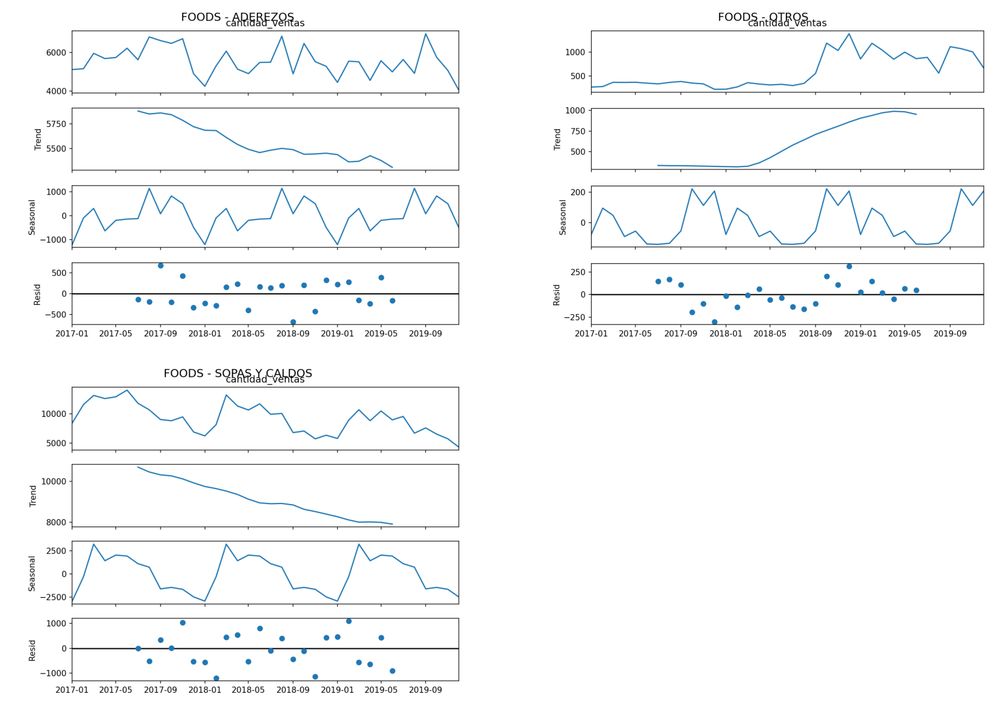

cat 1 - REF


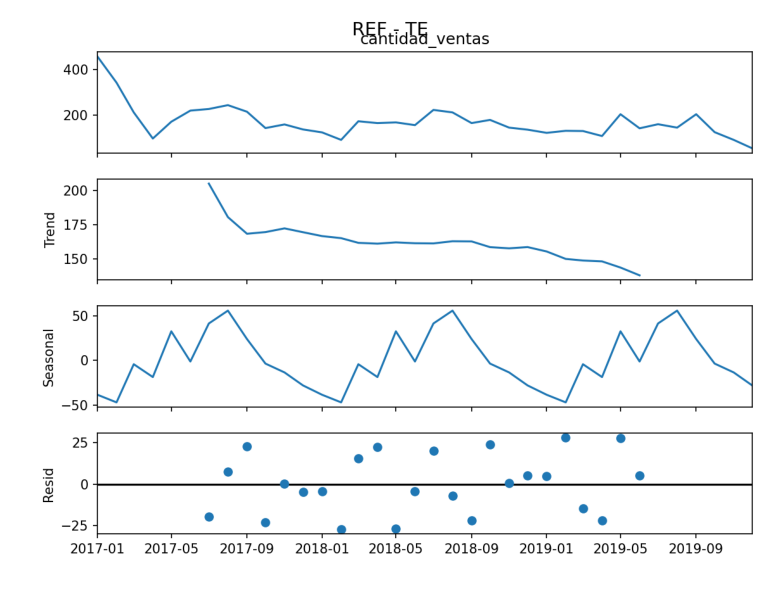

cat 1 - PC


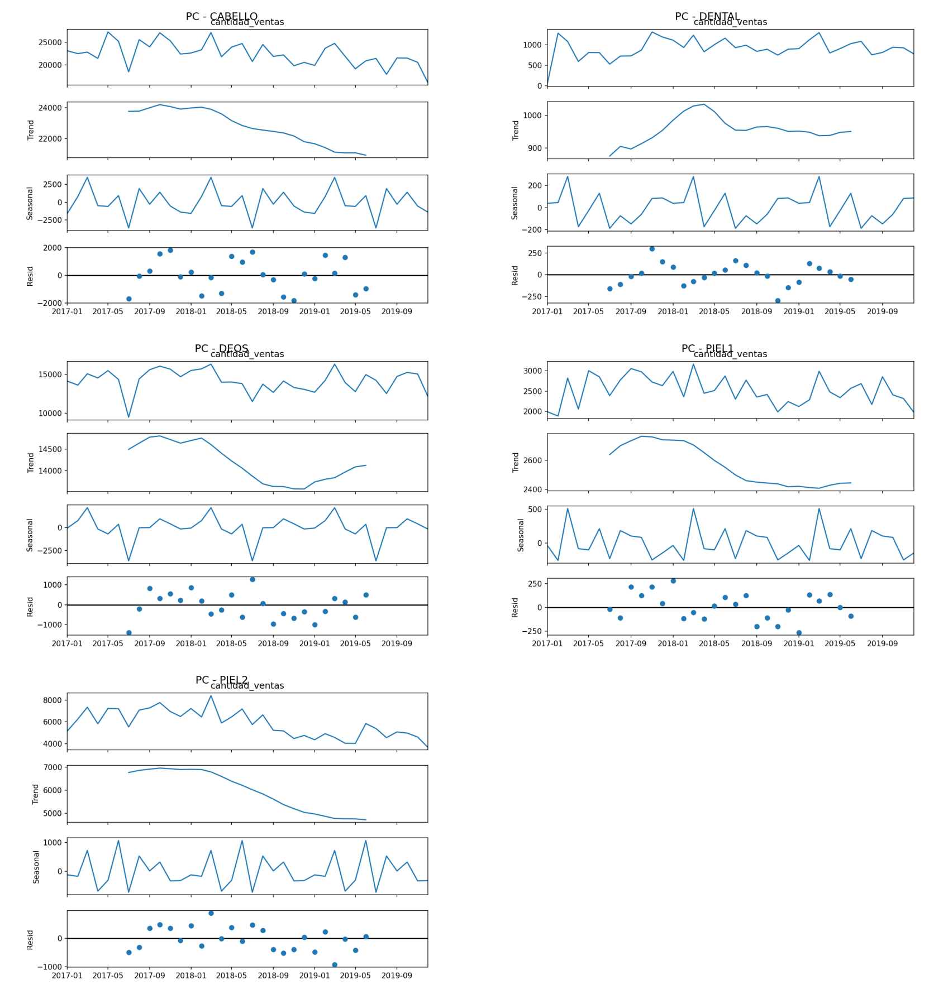

cat 1 - HC


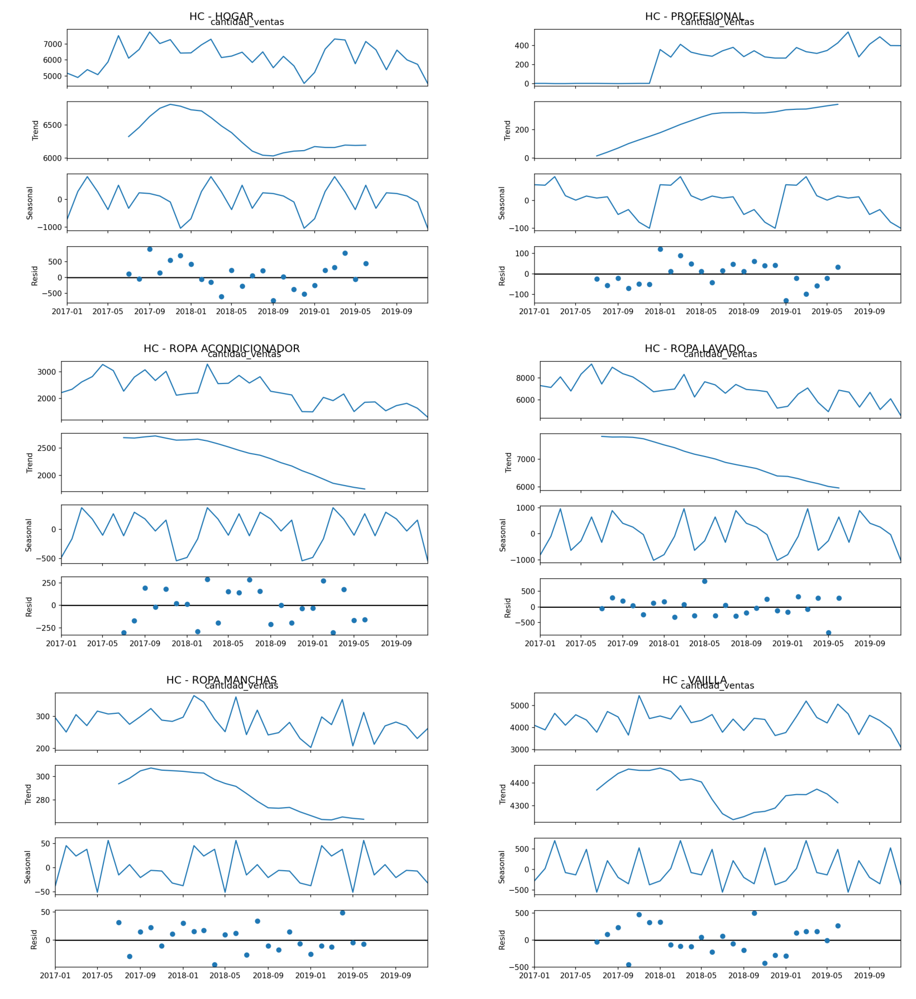

In [383]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import io
import pandas as pd
import math

def descomposicion_serie_cat2_grid(df, cat1=None):
    """
    Descompone la serie temporal de frecuencia de ventas por cada cat2 dentro de una cat1 específica.
    En lugar de toneladas, usa la cantidad de registros de ventas mensuales.
    """

    # Filtrar por cat1 y solo ventas reales
    ventas_cat1 = df[(df['cat1'] == cat1) & (df['tn'] > 0)]

    # Agrupar por cat1, cat2 y periodo, contando la cantidad de ventas (registros)
    ventas_cat1 = (
        ventas_cat1.groupby(['cat1', 'cat2', 'periodo'])
        .size()
        .reset_index(name='cantidad_ventas')
    )

    # Convertir periodo a datetime
    ventas_cat1['periodo_dt'] = pd.to_datetime(ventas_cat1['periodo'].astype(str), format='%Y%m')

    # Obtener lista de cat2 únicas dentro del cat1
    cat2_list = ventas_cat1['cat2'].dropna().unique()

    n = len(cat2_list)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = axes.flatten()

    for i, cat2 in enumerate(cat2_list):
        # Armar la serie temporal mensual por cat2
        serie = (
            ventas_cat1[ventas_cat1['cat2'] == cat2]
            .set_index('periodo_dt')
            .sort_index()
            .resample('MS')['cantidad_ventas']
            .sum()
        )

        # Requiere al menos 24 puntos para descomponer
        if serie.notna().sum() >= 24:
            try:
                resultado = seasonal_decompose(serie, model='additive', period=12)

                # Graficar cada resultado individualmente en memoria
                temp_fig = resultado.plot()
                temp_fig.suptitle(f"{cat1} - {cat2}", fontsize=14)
                temp_fig.set_size_inches(8, 6)

                buf = io.BytesIO()
                temp_fig.savefig(buf, format='png', dpi=150)
                buf.seek(0)
                plt.close(temp_fig)

                img = mpimg.imread(buf)
                axes[i].imshow(img)
                axes[i].axis('off')

            except Exception as e:
                print(f"❌ Error en {cat1}-{cat2}: {e}")
                fig.delaxes(axes[i])
        else:
            print(f"⚠️ {cat1}-{cat2} no tiene suficientes datos.")
            fig.delaxes(axes[i])

    # Eliminar ejes vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

for cat in ['FOODS', 'REF', 'PC', 'HC']:
    print(f"cat 1 - {cat}")
    descomposicion_serie_cat2_grid(df, cat)

##### Descompocision serie por categoria 3 y toneladas vendidas

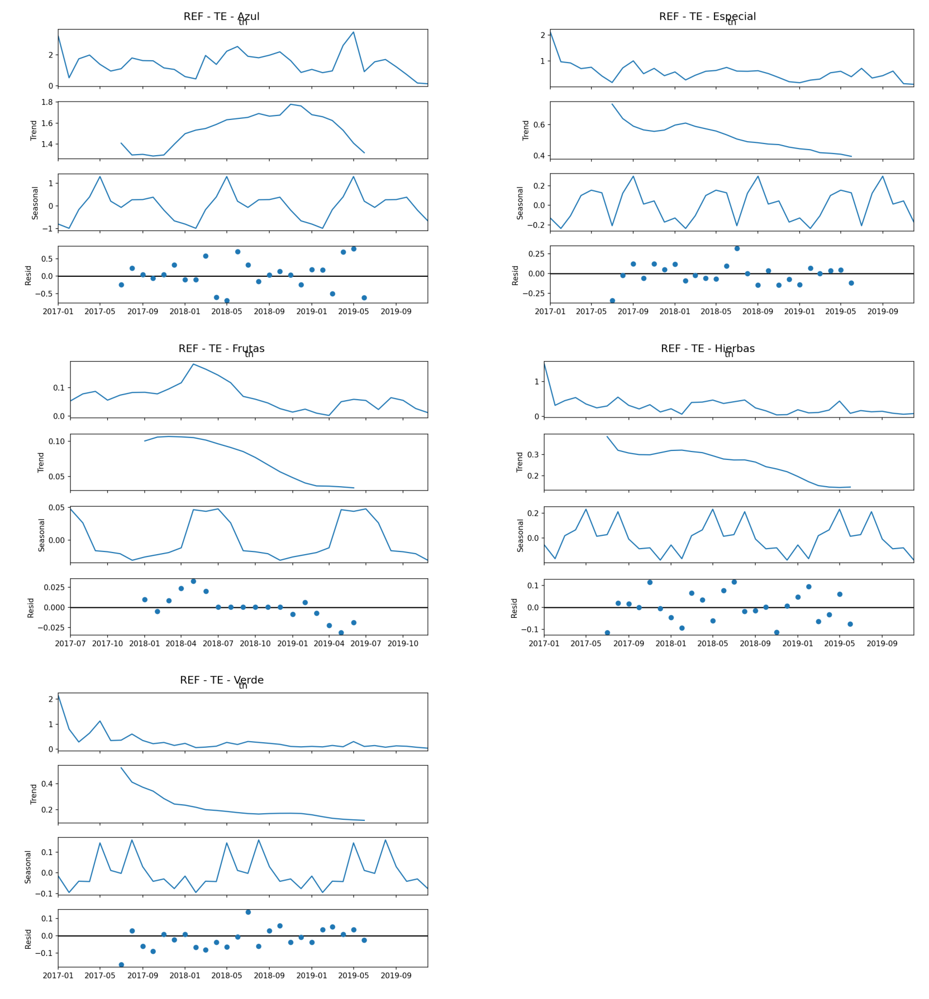

Categoría ACONDICIONADOR no tiene suficientes datos.
Categoría Antigrasa no tiene suficientes datos.
Categoría Baño no tiene suficientes datos.
Categoría JABON LIQUIDO no tiene suficientes datos.
Categoría Jabon Hotel no tiene suficientes datos.
Categoría LV ROPA LIQUIDO no tiene suficientes datos.
Categoría LV ROPA POLVO no tiene suficientes datos.
Categoría Liquido no tiene suficientes datos.
Categoría Opaco no tiene suficientes datos.
Categoría PISOS no tiene suficientes datos.
Categoría SHAMPOO no tiene suficientes datos.
Categoría Vidrios no tiene suficientes datos.


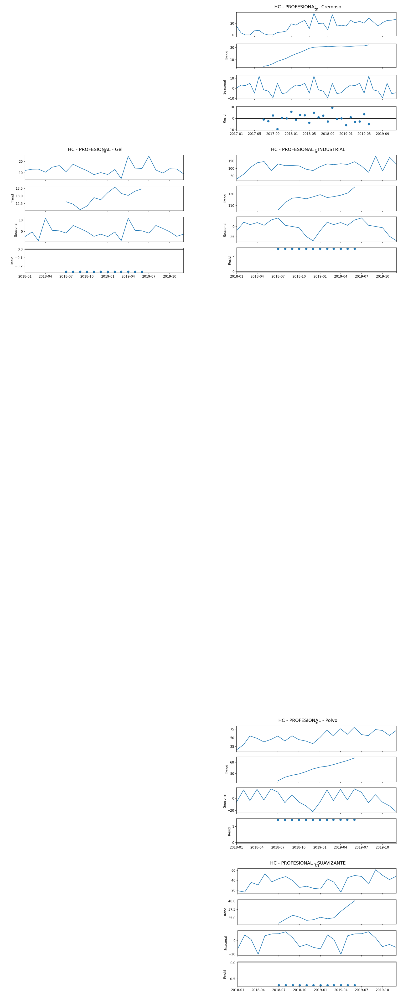

Categoría PurePapas no tiene suficientes datos.
Categoría Salsas no tiene suficientes datos.


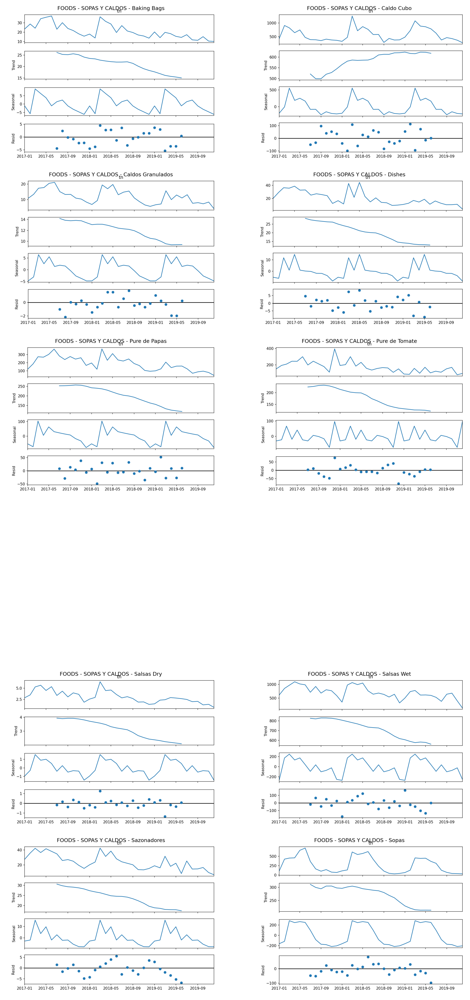

In [384]:
import io
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.image as mpimg
from statsmodels.tsa.seasonal import seasonal_decompose
import math

def descomposicion_serie_cat3_grid(df, cat1=None, cat2=None):
    # Filtrar por cat1 y cat2
    ventas_cat1 = df[(df['cat1'] == cat1) & (df['cat2'] == cat2)]

    # Agrupar ventas
    ventas_cat1 = (
        ventas_cat1.groupby(['cat1', 'cat2', 'cat3', 'periodo'])['tn']
        .sum()
        .reset_index()
    )
    ventas_cat1['periodo_dt'] = pd.to_datetime(ventas_cat1['periodo'].astype(str), format='%Y%m')
    ventas_cat1['cat1y2y3'] = ventas_cat1['cat1'] + "-" + ventas_cat1['cat2'] + "-" + ventas_cat1['cat3']

    cat3_list = ventas_cat1['cat3'].dropna().unique()
    n = len(cat3_list)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = axes.flatten()

    for i, cat3 in enumerate(cat3_list):
        serie = (
            ventas_cat1[ventas_cat1['cat3'] == cat3]
            .set_index('periodo_dt')
            .sort_index()
            .resample('MS')['tn']
            .sum()
        )

        if serie.notna().sum() >= 24:
            try:
                resultado = seasonal_decompose(serie, model='additive', period=12)

                # Crear figura temporal y guardar en buffer
                temp_fig = resultado.plot()
                temp_fig.suptitle(f"{cat1} - {cat2} - {cat3}", fontsize=14)
                temp_fig.set_size_inches(8, 6)
                buf = io.BytesIO()
                temp_fig.savefig(buf, format='png', dpi=150)
                buf.seek(0)
                plt.close(temp_fig)

                # Leer imagen desde buffer y mostrar en subplot
                img = mpimg.imread(buf)
                axes[i].imshow(img)
                axes[i].axis('off')

            except Exception as e:
                print(f"Error en categoría {cat3}: {e}")
                fig.delaxes(axes[i])
        else:
            print(f"Categoría {cat3} no tiene suficientes datos.")
            fig.delaxes(axes[i])

    # Ocultar ejes vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Pongo un par de ejemplos solamente
descomposicion_serie_cat3_grid(df, 'REF','TE')
descomposicion_serie_cat3_grid(df, 'HC','PROFESIONAL')
descomposicion_serie_cat3_grid(df, 'FOODS','SOPAS Y CALDOS')

##### Descomposicion serie por categoria 3 y ventas realizadas

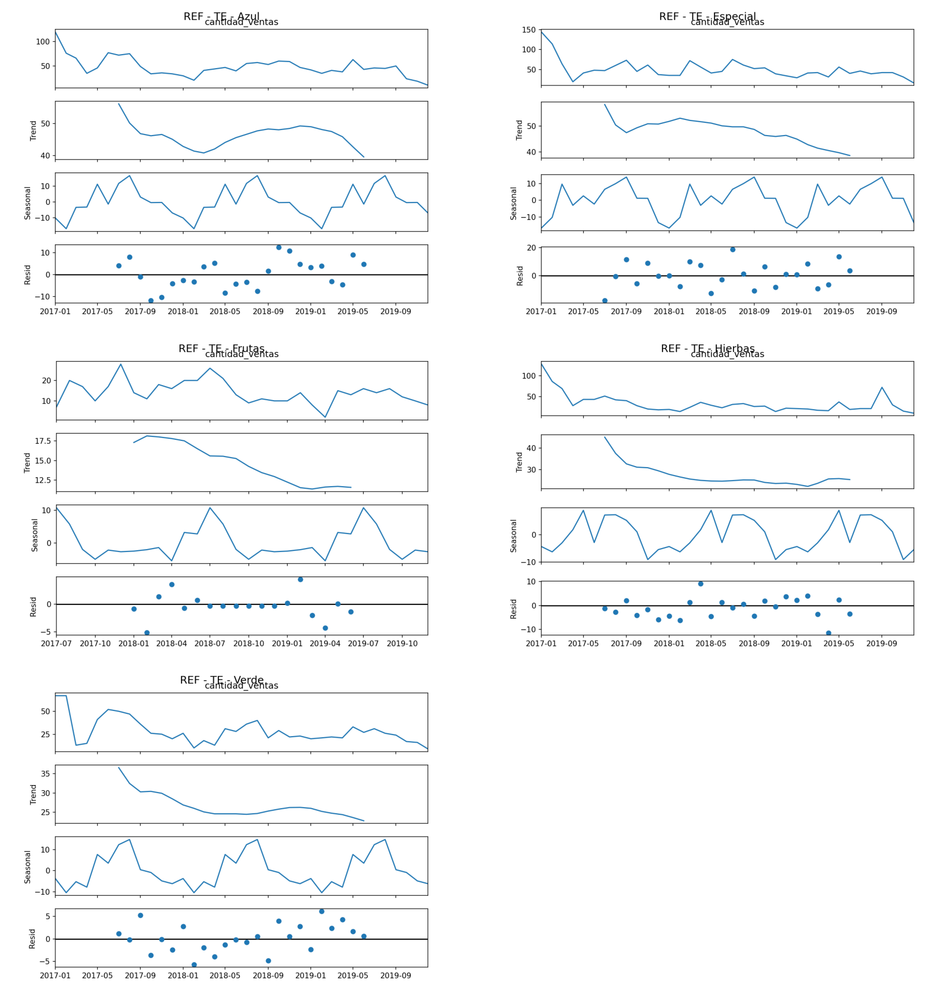

Categoría ACONDICIONADOR no tiene suficientes datos.
Categoría Antigrasa no tiene suficientes datos.
Categoría Baño no tiene suficientes datos.
Categoría JABON LIQUIDO no tiene suficientes datos.
Categoría Jabon Hotel no tiene suficientes datos.
Categoría LV ROPA LIQUIDO no tiene suficientes datos.
Categoría LV ROPA POLVO no tiene suficientes datos.
Categoría Liquido no tiene suficientes datos.
Categoría Opaco no tiene suficientes datos.
Categoría PISOS no tiene suficientes datos.
Categoría SHAMPOO no tiene suficientes datos.
Categoría Vidrios no tiene suficientes datos.


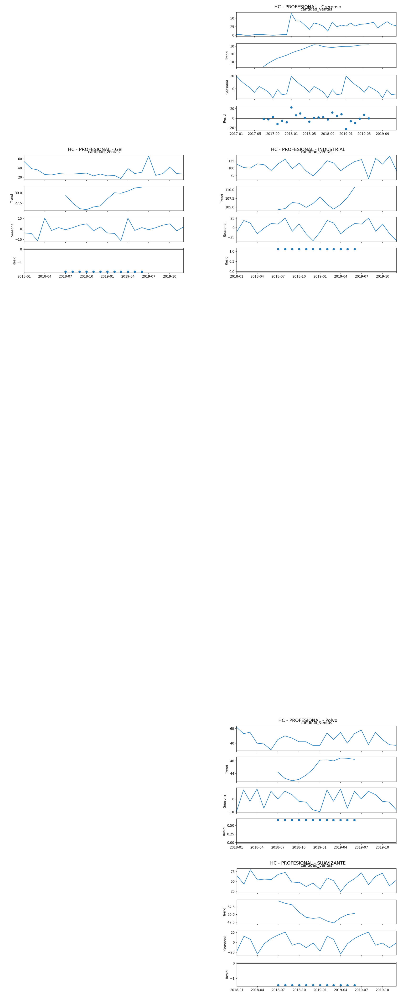

Categoría PurePapas no tiene suficientes datos.
Categoría Salsas no tiene suficientes datos.


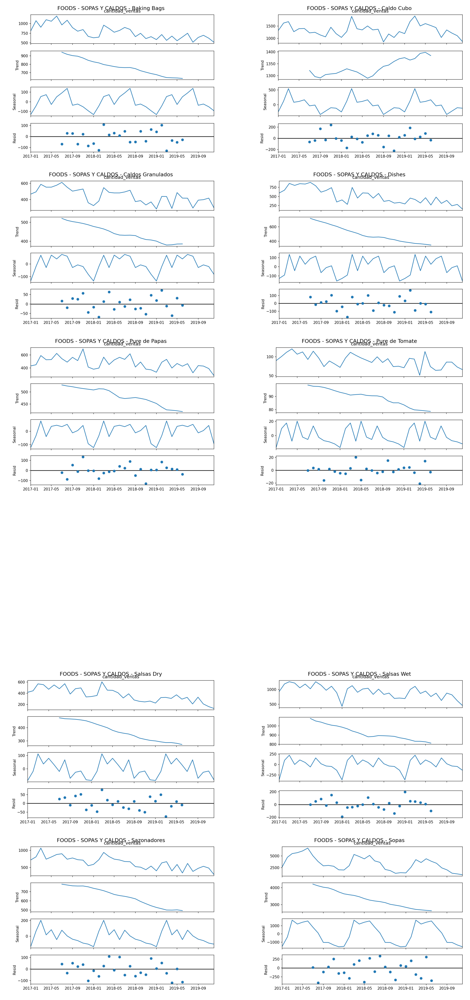

In [385]:
import io
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.image as mpimg
from statsmodels.tsa.seasonal import seasonal_decompose
import math

def descomposicion_serie_cat3_grid(df, cat1=None, cat2=None):
    """
    Descompone la serie temporal de frecuencia de ventas mensuales por cat3
    dentro de una combinación específica de cat1 y cat2.
    En lugar de sumar toneladas, cuenta cuántas ventas (registros) hubo por mes.
    """

    # Filtrar por la combinación especificada y ventas reales
    ventas_cat1 = df[(df['cat1'] == cat1) & (df['cat2'] == cat2) & (df['tn'] > 0)]

    # Agrupar por cat1, cat2, cat3 y periodo → contar cantidad de registros
    ventas_cat1 = (
        ventas_cat1
        .groupby(['cat1', 'cat2', 'cat3', 'periodo'])
        .size()
        .reset_index(name='cantidad_ventas')
    )

    # Convertir periodo a datetime
    ventas_cat1['periodo_dt'] = pd.to_datetime(ventas_cat1['periodo'].astype(str), format='%Y%m')
    ventas_cat1['cat1y2y3'] = ventas_cat1['cat1'] + "-" + ventas_cat1['cat2'] + "-" + ventas_cat1['cat3']

    # Lista de cat3 únicas
    cat3_list = ventas_cat1['cat3'].dropna().unique()
    n = len(cat3_list)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = axes.flatten()

    for i, cat3 in enumerate(cat3_list):
        # Construir serie temporal mensual para cada cat3
        serie = (
            ventas_cat1[ventas_cat1['cat3'] == cat3]
            .set_index('periodo_dt')
            .sort_index()
            .resample('MS')['cantidad_ventas']
            .sum()
        )

        if serie.notna().sum() >= 24:
            try:
                resultado = seasonal_decompose(serie, model='additive', period=12)

                temp_fig = resultado.plot()
                temp_fig.suptitle(f"{cat1} - {cat2} - {cat3}", fontsize=14)
                temp_fig.set_size_inches(8, 6)

                buf = io.BytesIO()
                temp_fig.savefig(buf, format='png', dpi=150)
                buf.seek(0)
                plt.close(temp_fig)

                img = mpimg.imread(buf)
                axes[i].imshow(img)
                axes[i].axis('off')

            except Exception as e:
                print(f"Error en categoría {cat3}: {e}")
                fig.delaxes(axes[i])
        else:
            print(f"Categoría {cat3} no tiene suficientes datos.")
            fig.delaxes(axes[i])

    # Eliminar subplots vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

descomposicion_serie_cat3_grid(df, 'REF', 'TE')
descomposicion_serie_cat3_grid(df, 'HC', 'PROFESIONAL')
descomposicion_serie_cat3_grid(df, 'FOODS', 'SOPAS Y CALDOS')

##### Descomposicion Serie por producto_id

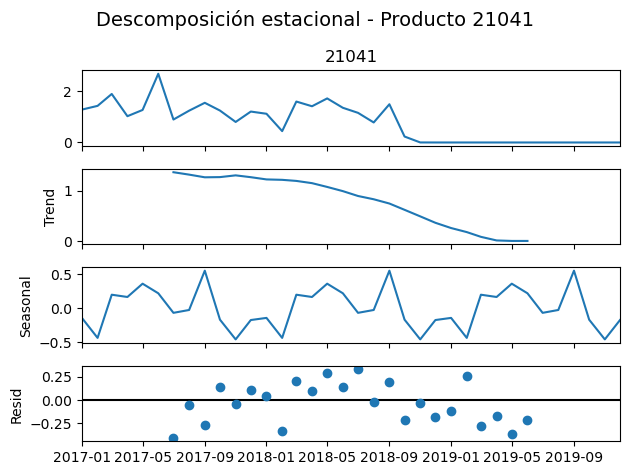

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Agrupar y pivotear como siempre
ventas = df.groupby(['product_id', 'periodo'])['tn'].sum().reset_index()
ventas['periodo_dt'] = pd.to_datetime(ventas['periodo'].astype(str), format='%Y%m')

# Pivot por producto
pivot = ventas.pivot(index='product_id', columns='periodo_dt', values='tn').fillna(0)




# crecientes = [20402,20112,20049] # 24 meses
# volátil = [20741, 20808, 20891]  # 24 meses
# estable = [20001, 20483, 20538] # 24 meses
# inactiva = [21129, 21146, 20918] # 5 meses
# decreciente = [20983, 21041, 20245] # 23 meses




# ✅ Filtrar solo el producto_id 20741
if 21041 in pivot.index:
    serie = pivot.loc[21041]
    serie.index = pd.to_datetime(serie.index)

    # Verificar que tenga al menos 24 meses con datos
    if (serie != 0).sum() >= 24:
        try:
            resultado = seasonal_decompose(serie, model='additive', period=24)
            fig = resultado.plot()
            fig.suptitle(f"Descomposición estacional - Producto 21041", fontsize=14)
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error con producto 21041: {e}")
    else:
        print("❌ El producto 21041 no tiene al menos 24 meses con datos.")
else:
    print("❌ El producto 21041 no está en el dataset.")


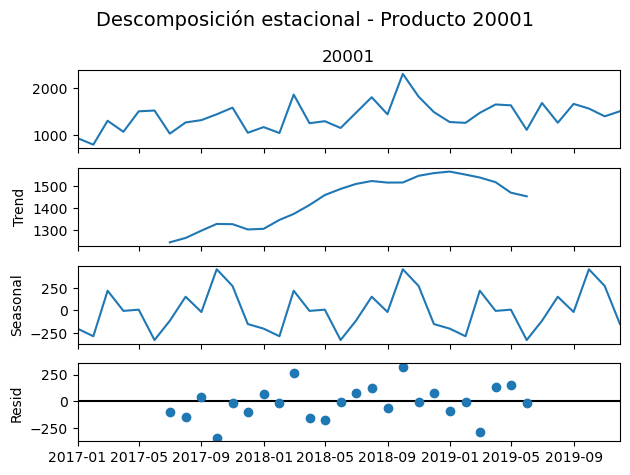

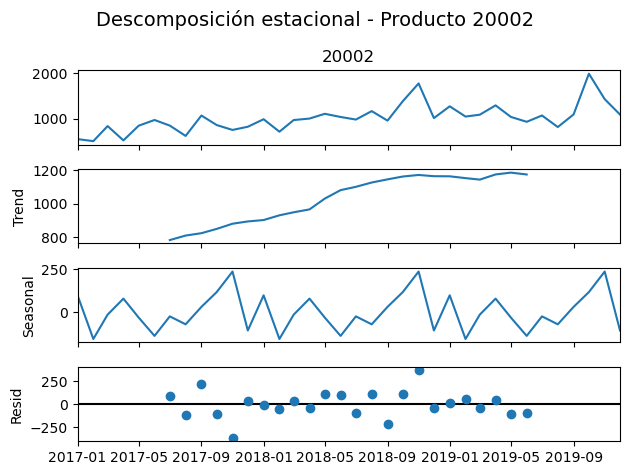

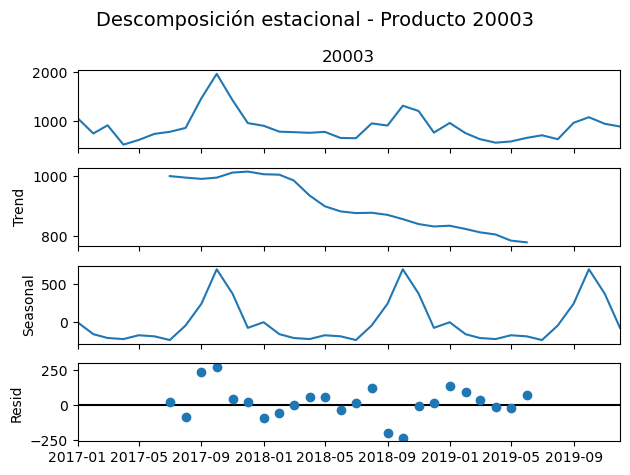

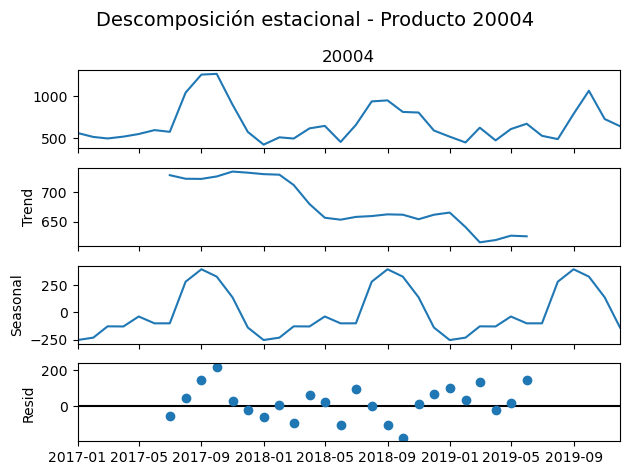

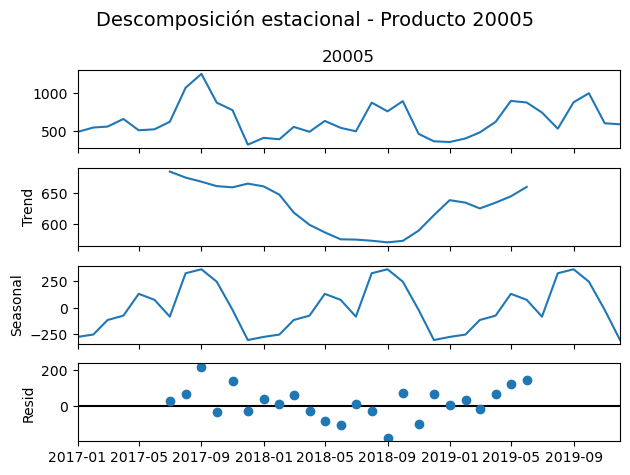

In [ ]:
# from statsmodels.tsa.seasonal import seasonal_decompose

# ventas = df.groupby(['product_id', 'periodo'])['tn'].sum().reset_index()
# ventas['periodo_dt'] = pd.to_datetime(ventas['periodo'].astype(str), format='%Y%m')

# pivot = ventas.pivot(index='product_id', columns='periodo_dt', values='tn').fillna(0)
# pivot = pivot.iloc[:5]

# # pivot = pivot.loc[20313]

# # Recorrer productos con al menos 24 períodos de datos no nulos
# for product_id in pivot.index:
#     serie = pivot.loc[product_id]

#     # Reindexar a fechas (necesario para descomposición)
#     serie.index = pd.to_datetime(serie.index)

#     # Verificar que tenga al menos 24 valores no nulos
#     if (serie != 0).sum() >= 24:
#         try:
#             resultado = seasonal_decompose(serie, model='additive', period=12)
#             fig = resultado.plot()
#             fig.suptitle(f"Descomposición estacional - Producto {product_id}", fontsize=14)
#             plt.tight_layout()
#             plt.show()
#         except Exception as e:
#             print(f"Error con producto {product_id}: {e}")


##### Top 10 Categorias más vendidas

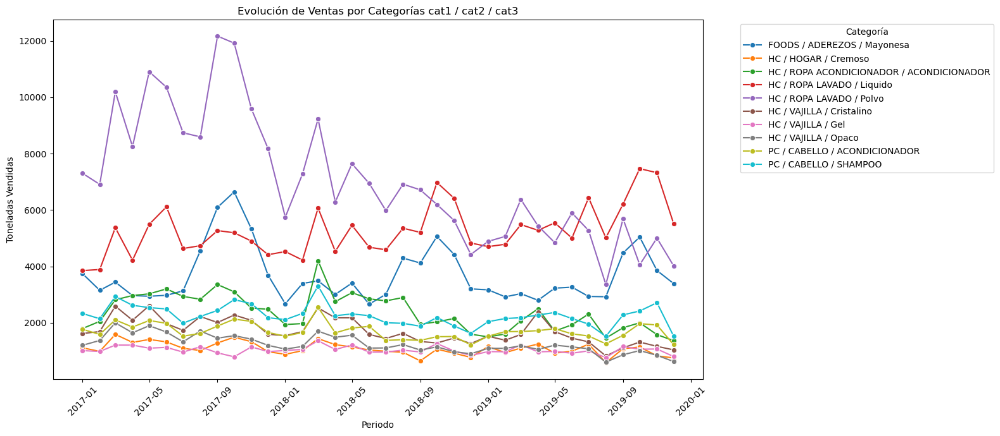

In [196]:
# Agrupar
ventas_categorias = df.groupby(['periodo', 'cat1', 'cat2', 'cat3'])['tn'].sum().reset_index()
ventas_categorias['periodo_dt'] = pd.to_datetime(ventas_categorias['periodo'].astype(str), format='%Y%m')

# Crear columna combinada para graficar
ventas_categorias['categoria_completa'] = (
    ventas_categorias['cat1'].astype(str) + " / " +
    ventas_categorias['cat2'].astype(str) + " / " +
    ventas_categorias['cat3'].astype(str)
)

# Como hay muchas combinaciones, filtramos

top_categorias = (
    ventas_categorias.groupby('categoria_completa')['tn']
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .index
)

ventas_top = ventas_categorias[ventas_categorias['categoria_completa'].isin(top_categorias)]

plt.figure(figsize=(16, 7))
sns.lineplot(data=ventas_top, x='periodo_dt', y='tn', hue='categoria_completa', marker='o')
plt.title("Evolución de Ventas por Categorías cat1 / cat2 / cat3")
plt.xlabel("Periodo")
plt.ylabel("Toneladas Vendidas")
plt.xticks(rotation=45)
plt.legend(title="Categoría", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### Promedio Mensual de Ventas por Categoría (cat1/cat2/cat3)

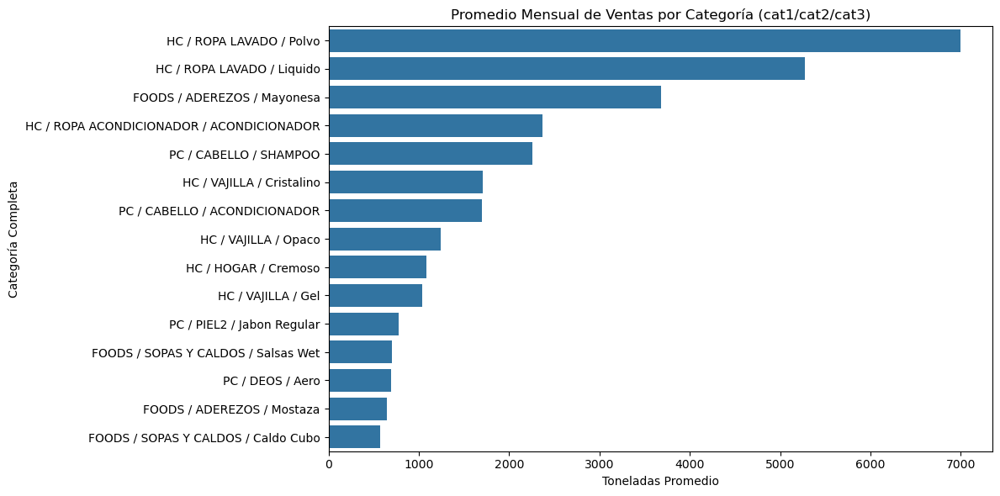

In [197]:
# Distribucion promedio por categoria completa
ventas_avg = (
    ventas_categorias
    .groupby('categoria_completa')['tn']
    .mean()
    .sort_values(ascending=False)
    .head(15)
)

plt.figure(figsize=(12, 6))
sns.barplot(x=ventas_avg.values, y=ventas_avg.index)
plt.title("Promedio Mensual de Ventas por Categoría (cat1/cat2/cat3)")
plt.xlabel("Toneladas Promedio")
plt.ylabel("Categoría Completa")
plt.tight_layout()
plt.show()


##### Precios Cuidados

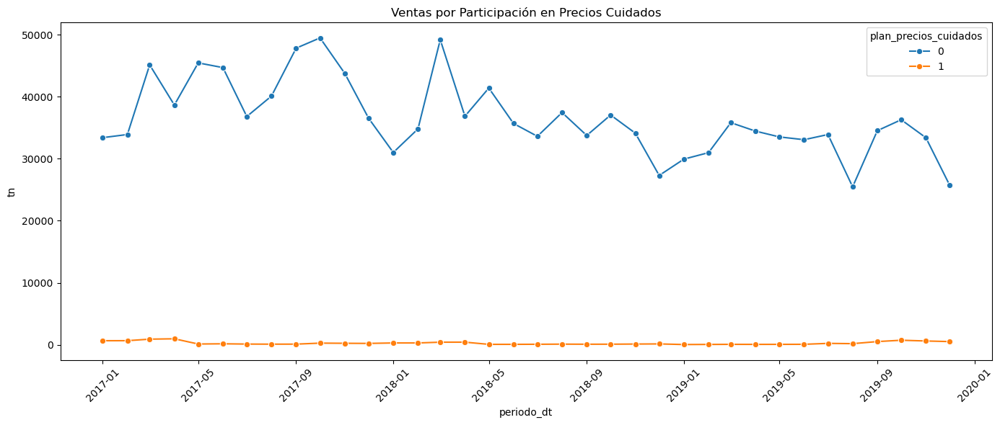

In [200]:
# 7. IMPACTO DE PRECIOS CUIDADOS
pc_impacto = df.groupby(['periodo', 'plan_precios_cuidados'])['tn'].sum().reset_index()
pc_impacto['periodo_dt'] = pd.to_datetime(pc_impacto['periodo'].astype(str), format='%Y%m')
pc_impacto['periodo'] = pc_impacto['periodo'].astype(str)
plt.figure(figsize=(14, 6))
sns.lineplot(data=pc_impacto, x='periodo_dt', y='tn', hue='plan_precios_cuidados', marker='o')
plt.title("Ventas por Participación en Precios Cuidados")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### Diferencia entre Pedido y Compra

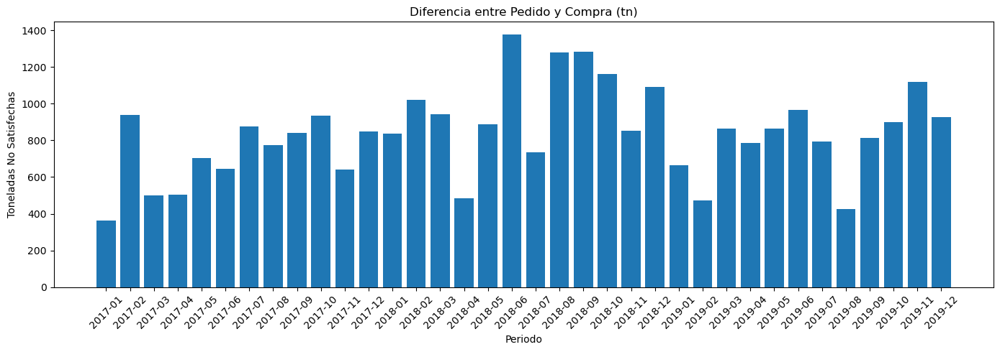

In [35]:
# 8. DIFERENCIA ENTRE PEDIDO Y COMPRA
df['tn_gap'] = df['cust_request_tn'] - df['tn']

gap_mensual = df.groupby('anio_mes')['tn_gap'].sum().reset_index()
gap_mensual['anio_mes'] = gap_mensual['anio_mes'].astype(str)

plt.figure(figsize=(14, 5))
plt.bar(gap_mensual['anio_mes'].astype(str), gap_mensual['tn_gap'])
plt.title("Diferencia entre Pedido y Compra (tn)")
plt.xlabel("Periodo")
plt.ylabel("Toneladas No Satisfechas")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### Quiebres de Stock

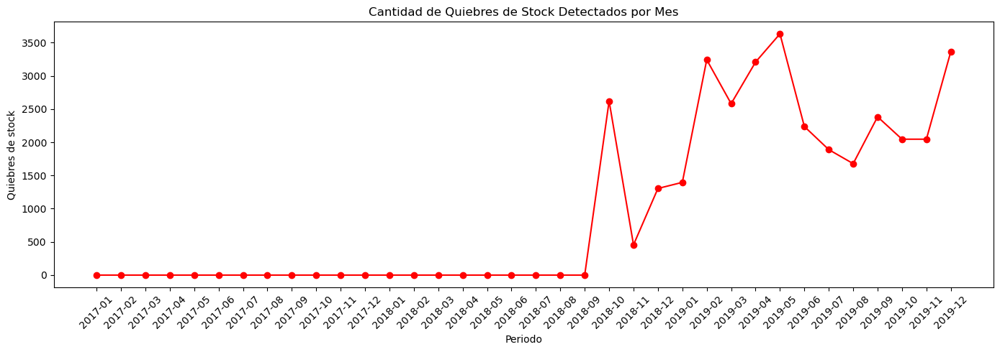

In [36]:
# 9. ANÁLISIS DE STOCKS
df['quiebre_stock'] = np.where((df['cust_request_tn'] > 0) & (df['stock_final'] == 0), 1, 0)
quiebres = df.groupby('anio_mes')['quiebre_stock'].sum().reset_index()

quiebres['anio_mes'] = quiebres['anio_mes'].astype(str)

plt.figure(figsize=(14, 5))
plt.plot(quiebres['anio_mes'].astype(str), quiebres['quiebre_stock'], marker='o', color='red')
plt.title("Cantidad de Quiebres de Stock Detectados por Mes")
plt.xlabel("Periodo")
plt.ylabel("Quiebres de stock")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# 10. TOP PRODUCTOS MAS VENDIDOS
top_productos = df.groupby('product_id')['tn'].sum().sort_values(ascending=False).head(10).reset_index()
top_productos = top_productos.merge(productos, on='product_id', how='left')

In [38]:
print("Top 10 productos más vendidos:")
display(top_productos[['product_id', 'brand', 'cat1', 'cat2', 'tn']])

Top 10 productos más vendidos:


,product_id,brand,cat1,cat2,tn
0,20001,ARIEL,HC,ROPA LAVADO,50340.39558
1,20010,LIMPIEX,HC,ROPA LAVADO,37342.15836
2,20010,LIMPIEX,HC,ROPA LAVADO,37342.15836
3,20002,LIMPIEX,HC,ROPA LAVADO,36337.25439
4,20003,NATURA,FOODS,ADEREZOS,32004.15274
5,20021,LIMPIEX,HC,ROPA LAVADO,25003.78252
6,20021,LIMPIEX,HC,ROPA LAVADO,25003.78252
7,20020,LIMPIEX,HC,ROPA LAVADO,24516.78008
8,20020,LIMPIEX,HC,ROPA LAVADO,24516.78008
9,20004,NATURA,FOODS,ADEREZOS,24178.15379


In [41]:
# 10. TOP PRODUCTOS menos VENDIDOS
df_aux = df.copy()
df_aux.dropna(inplace=True)
top_productos = df.groupby('product_id')['tn'].sum().sort_values(ascending=True).head(10).reset_index()
top_productos = top_productos.merge(productos, on='product_id', how='left')

In [42]:
print("Top 10 productos más vendidos:")
display(top_productos[['product_id', 'brand', 'cat1', 'cat2', 'tn']])

Top 10 productos más vendidos:


,product_id,brand,cat1,cat2,tn
0,21299,NaN,NaN,NaN,0.00546
1,21298,NaN,NaN,NaN,0.00573
2,21297,NaN,NaN,NaN,0.00579
3,21296,NaN,NaN,NaN,0.00651
4,21295,NaN,NaN,NaN,0.00699
5,21294,NIVEA,PC,CABELLO,0.00764
6,21293,NaN,NaN,NaN,0.00917
7,21292,NaN,NaN,NaN,0.00983
8,21291,NaN,NaN,NaN,0.01092
9,21290,NaN,NaN,NaN,0.01174


In [51]:
import streamlit as st

# EDA al grano

🎯 Objetivo:

Analizar productos individualmente para entender:

    Su evolución temporal

    Comparación entre lo pedido y lo efectivamente comprado

    Relación con stock disponible

    Participación en programas como Precios Cuidados

    Estacionalidad y consistencia de ventas

In [ ]:
producto_objetivo = 20001
df_producto = df[df['product_id'] == producto_objetivo].copy()

Se encontraron 961 productos con al menos 12 meses de ventas.
